## M1 [KTL]: REFIT House 2 to REFIT House 2

### Reference paper:
 * A. M. A. Ahmed, Y. Zhang and F. Eliassen, "Generative Adversarial Networks and Transfer Learning for Non-Intrusive Load Monitoring in Smart Grids," 2020 IEEE International Conference on Communications, Control, and Computing Technologies for Smart Grids (SmartGridComm), Tempe, AZ, USA, 2020, pp. 1-7, doi: 10.1109/SmartGridComm47815.2020.9302933.

### Importing packages

In [1]:
import os
import numpy as np
import math

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader, Dataset
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler as standarize_data
from sklearn.preprocessing import MinMaxScaler as scale_data
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error, zero_one_loss, mean_absolute_error, r2_score  
plt.style.use('bmh')


### parameters and configuration

In [2]:
lr=0.00002   #0.000001
b1=0.5
b2=0.999
n_epochs=5000
batch_size=1024
s=2
sample_interval=500

cuda = True if torch.cuda.is_available() else False

FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor

cuda



True

## loading, downsampling and scaling data

In [3]:
import pandas as pd
def dataProvider(train, windowsize):
    
    data_frame = pd.read_csv(train,
                             #chunksize=10 ** 3,
                             header=0
                             )
    np_array = np.array(data_frame)
    X_to_disaggregate, Y_true = np_array[:, 0], np_array[:, 1]
    agg_len=X_to_disaggregate.shape[0]
    w=windowsize
    step=int(15)
    agg_segments=np.zeros((1,w))
    app_segments=np.zeros((1,w))
    i=0
    while i<=agg_len-w:
        agg_segment=X_to_disaggregate[i:i+w].reshape(1,-1)
        app_segment=Y_true[i:i+w].reshape(1,-1)
        agg_segments=np.concatenate((agg_segments,agg_segment),axis=0)
        app_segments=np.concatenate((app_segments,app_segment),axis=0)
        i+=step

    agg_segments=agg_segments[1:,:]    
    app_segments=app_segments[1:,:]
    return agg_segments, app_segments


In [4]:
trainfile1 = "F:/NILM/training_data/microwave_house_2_training_.csv"
trainfile2 = "F:/NILM/training_data/microwave_house_3_training_.csv"
testfile="F:/NILM/training_data/microwave_test_.csv"
X1,Y1=dataProvider(testfile,19)
X2,Y2=dataProvider(trainfile1,19)
X3,Y3=dataProvider(trainfile2,19)
X=np.concatenate((X1,X2,X3),axis=0)
Y=np.concatenate((Y1,Y2,Y3),axis=0)
print(X.shape)
print(Y.shape)

(35383, 19)
(35383, 19)


In [5]:
# loading the signature and aggregate measurement

# # apply a threshold of 50
# X_train[X_train<=50] = 0
# Y_train[Y_train<=50] = 0
n_train=int(0.8*len(X))
X_train=X[:n_train]
X_test=X[n_train:]
Y_train = Y[:n_train]
Y_test= Y[n_train:]
# Scaling data
scale_agg=scale_data()
scale_app=scale_data()

scale_agg_test=scale_data()
scale_app_test=scale_data()

scale_agg.fit(X_train)
scale_app.fit(Y_train)

# Transforming trainig data

X_train_n=scale_agg.transform(X_train)
Y_train_n=scale_app.transform(Y_train)

X_train_n.shape

(28306, 19)

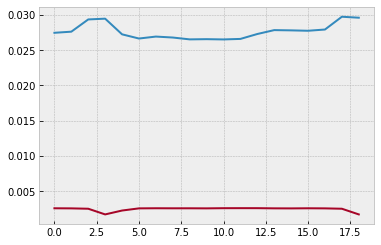

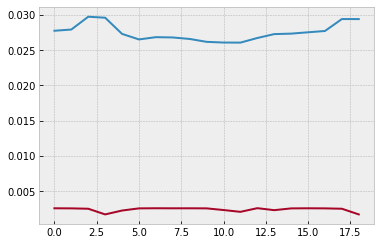

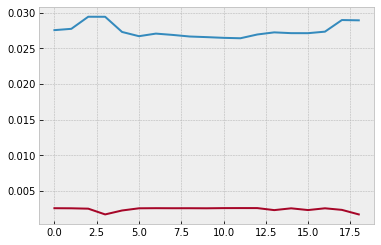

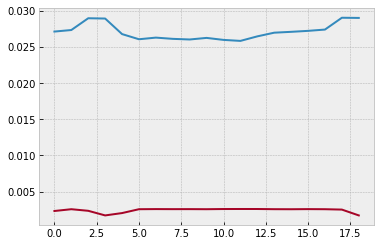

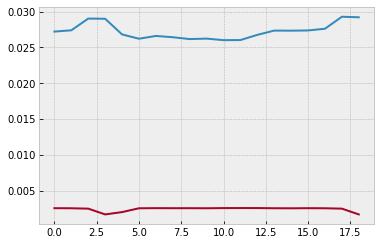

...

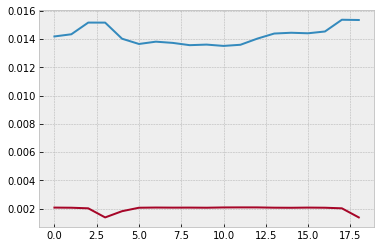

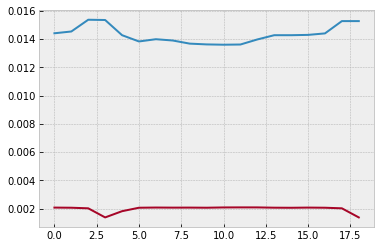

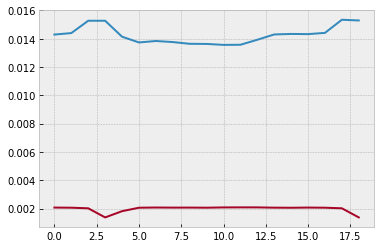

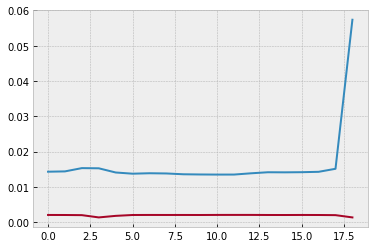

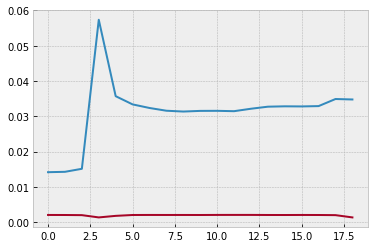

(28306, 19)

In [32]:
# Uncomment those lines to plot some examples
for i in range(50):
    plt.plot(X_train_n[i,:])
    plt.plot(Y_train_n[i,:])
    plt.show()
X_train.shape

## GANNILM Classes

In [6]:
sig_len=19
class Swish(torch.nn.Module):
    def forward(self,x):
        return x * torch.sigmoid(x)


class Flatten(torch.nn.Module):
    def forward(self, x):
        batch_size = x.shape[0]
        return x.view(batch_size, -1)

    
class Projection(torch.nn.Module):
    def forward(self, x):
        batch_size = x.shape[0]
        return x.view(batch_size,projection,-1) #bsize, projection,length


    
class Generator(nn.Module):
    def __init__(self):
        super().__init__()


        def block(in_feat, out_feat, normalize=False):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.9))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        def conv(in_feat, out_feat, filter_size=5, stride=1,padding=True):
            if padding==True: 
                p=int((filter_size-1)/2)
            else:
                p=0
            conv_layers = [nn.Conv1d(in_feat, out_feat,filter_size,stride,padding=p)]
            conv_layers.append(nn.LeakyReLU(0.2, inplace=True))
            return conv_layers

        def flat():
            flatten=Flatten()
            layers = [flatten]
            #layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        def swish():
            s=Swish()
            layers = [s]
            return layers
        
        def project():
            project_layer=Projection()
            layers = [project_layer]
            return layers
        
        
        f=8#output featrue maps
        
        self.g1 = nn.Sequential(
            *conv(in_feat=1,out_feat=f*2,filter_size=5,stride=1,padding=True),
            

        )
        
        self.g2 = nn.Sequential(
            *conv(in_feat=f*2,out_feat=f*3,filter_size=5,stride=1,padding=True),
            *flat(),
        )
        
        self.g3 = nn.Sequential(
            *block(sig_len*f*3, int(sig_len*f*4), normalize=False),

        )
        
        
        self.g4 = nn.Sequential(
            *block(int(sig_len*f*4), int(sig_len*f*6)),

        )
        
        
        
        
        self.g5 = nn.Sequential(
            
            *block(int(sig_len*f*6), int(sig_len*f*4)),

        )
        
         
        self.g6 = nn.Sequential(
            
            *block(int(sig_len*f*4), int(sig_len*f*3)),

        )
        
        self.g7 = nn.Sequential(
            
            nn.Linear(int(sig_len*f*3), int(np.prod(sig_len))),
            nn.LeakyReLU(0.01, inplace=True) #tanh
        )

    #def forward(self, noise, labels):
    def forward(self,aggregate):
        X = self.g1(aggregate)
        X = self.g2(X)
        X = self.g3(X)
        X = self.g4(X)
        X = self.g5(X)
        X = self.g6(X)
        appliance = self.g7(X)
        return appliance

In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()


        d=4
        
        def conv(in_feat, out_feat, filter_size=5, stride=1,padding=True):
            if padding==True: 
                p=int((filter_size-1)/2)
            else:
                p=0
            conv_layers = [nn.Conv1d(in_feat, out_feat,filter_size,stride,padding=p)]
            conv_layers.append(nn.LeakyReLU(0.2, inplace=True))
            return conv_layers
        
        def flat():
            flatten=Flatten()
            layers = [flatten]
            return layers
        
        self.d1 = nn.Sequential(
            nn.Linear(int(sig_len*2), sig_len*d),
            nn.LeakyReLU(0.2, inplace=True),
            
            
        )
        
        self.d2 = nn.Sequential(
            nn.Linear(sig_len*d, sig_len*d),
            nn.LeakyReLU(0.2, inplace=True),
 
            
        )
        
        self.d3 = nn.Sequential(
            
            nn.Linear(sig_len*d, sig_len*d),
            nn.LeakyReLU(0.2, inplace=True),
            
            
        )
        
        self.d4 = nn.Sequential(

            nn.Linear(sig_len*d, sig_len*2),
            nn.LeakyReLU(0.2, inplace=True),
            
        )
        
        
        self.d5 = nn.Sequential(
            
            nn.Linear(sig_len*2, 1),
            nn.Sigmoid(),

        )
        
        

    def forward(self, d_input):
        X=self.d1(d_input)
        X=self.d2(X)
        X=self.d3(X)
        features=self.d4(X)
        validity = self.d5(features)
        
        return validity,features


In [8]:
class DataIterator(Dataset):
    def __init__(self):

        self.len=X_train_n.shape[0]
        self.xdata=torch.from_numpy(X_train_n)
        self.ydata=torch.from_numpy(Y_train_n)
        
    def __getitem__(self,index):
        return (self.xdata[index],self.ydata[index])
    
    def __len__(self):
        return(self.len)


## Loss Definition and instantiation

In [9]:
feature_loss=torch.nn.MSELoss()
# adversarial_loss = torch.nn.MSELoss()
adversarial_loss = torch.nn.BCELoss()

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()



## Loading Model

In [37]:
#uncomment those lines when loading a trained model
# PATH="gannilm_refit.pth"
# # PATH="gannilm_UKDALE.pth"
# checkpoint = torch.load(PATH)
# # generator.load_state_dict(checkpoint['g_state_dict'],strict=True)
# # discriminator.load_state_dict(checkpoint['d_state_dict'],strict=True)

## Utility Functions

In [10]:

def smooth(y, box_pts=2):
#     print("smooth in",y.shape)
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
#     print("smooth out",y_smooth.shape)
    return y_smooth


def down_sample(X,Y,s):
    #X=X.reshape(X.shape[0],X.shape[1])
    Y=Y.reshape(Y.shape[0],Y.shape[1])
    Y_s=Y[:, ::s]
    X_s=X[:,::s]
    dim=X_s.shape[1]
    return(X_s,Y_s.reshape(-1,dim))


def sample_data(n_row, batches_done):

    
    a_to_s=X_train_n[0:10,:] # z
    agg_to_sample=a_to_s.reshape(a_to_s.shape[0],1,a_to_s.shape[1])
    
    true_app=Y_train_n[0:10,:]
 
    agg_to_sample = Variable(FloatTensor(agg_to_sample))
    gen_ds = generator(agg_to_sample)
    

    
    gen_ds_inv=scale_app.inverse_transform(gen_ds.cpu().detach())
    true_app_inv=scale_app.inverse_transform(true_app)
 
    
 

    plt.plot(smooth(gen_ds_inv[0,:]),label="GAN")
    plt.plot(true_app_inv[0,:],label="Real")
    plt.legend()
    plt.show()

    plt.plot(smooth(gen_ds_inv[5,:]),label="GAN")
    plt.plot(true_app_inv[5,:],label="real")
    plt.legend()
    plt.show()


    
    

def disaggregate(x):
    x = Variable(FloatTensor(x))
    gen_appliance = generator(x)
    return (gen_appliance)

def confidence(appliance,aggregate):
    agg=Variable(FloatTensor(aggregate))
    d_in=torch.cat((appliance,agg),1)
    conf,_=discriminator(d_in)
    return(conf)


   
def classification_metrics(pred1, real_measurements1,thresh):
#    real_measurements
#    pred=predictions
    
    pred=np.copy(pred1)
    real_measurements=np.copy(real_measurements1)
    on_threshold=thresh
    pred[pred <=on_threshold] = 0
    pred[pred >on_threshold] = 1
    
    
    real_measurements[real_measurements <=on_threshold] = 0
    real_measurements[real_measurements >on_threshold] = 1

    TP=np.sum(np.logical_and(pred == 1, real_measurements == 1))
    FP=np.sum(np.logical_and(pred == 1, real_measurements == 0))

    FN=np.sum(np.logical_and(pred == 0, real_measurements == 1))
    TN=np.sum(np.logical_and(pred == 0, real_measurements == 0))
    P=sum(real_measurements)
    N=len(real_measurements)-sum(real_measurements)
    
    recall=TP/(TP+FN)
    precision=TP/(TP+FP)
    F1=2*(precision*recall)/(precision+recall)
    accuracy=(TP+TN)/(P+N)
    
    return(recall,precision,F1,accuracy)
    
    
    

def energy_metrics(pred1, real_measurements1,thresh):
    
    
    pred=np.copy(pred1)
    real_measurements=np.copy(real_measurements1)
    on_threshold=thresh
    pred[pred <=on_threshold] = 0
    real_measurements[real_measurements <=on_threshold] = 0

    
    E=np.sum(real_measurements)
    E_hat=np.sum(pred)
    RE=(E_hat-E)/(max(E,E_hat))
#     RE=(E_hat-E)/(E)
    T=len(pred)
    MAE=(1/T)*sum(np.abs(pred-real_measurements))
    return(RE,MAE)






## TL configuring

Batch_no: 0  Epoch: 0


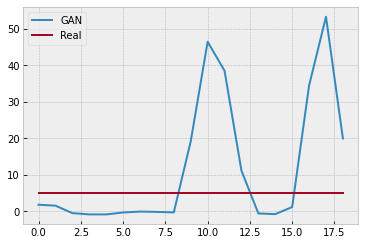

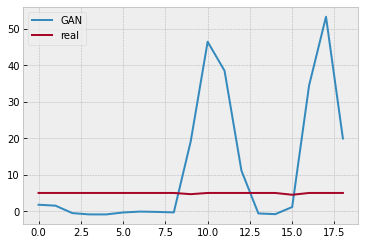

Batch_no: 500  Epoch: 17


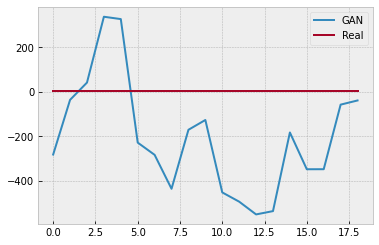

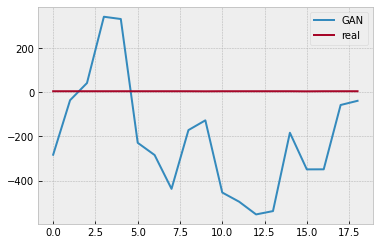

Batch_no: 1000  Epoch: 35


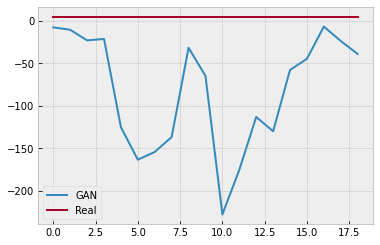

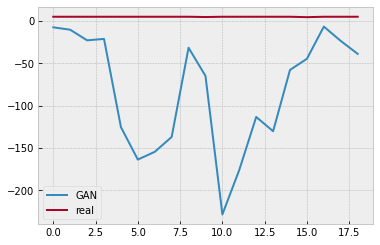

Batch_no: 1500  Epoch: 53


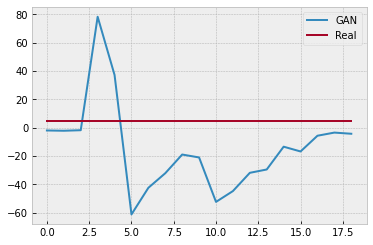

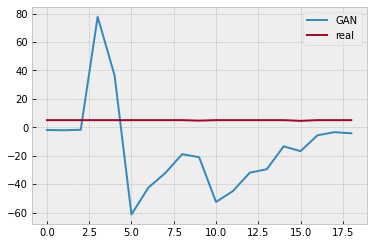

Batch_no: 2000  Epoch: 71


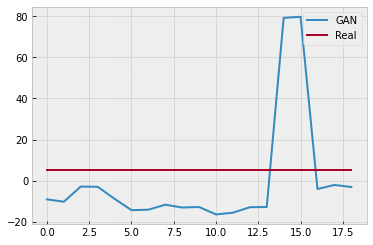

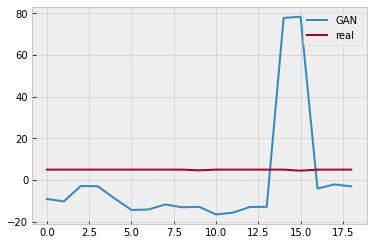

Batch_no: 2500  Epoch: 89


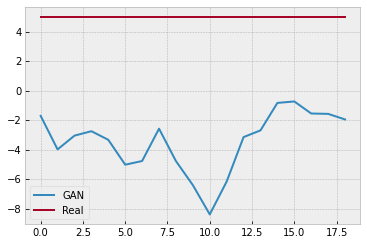

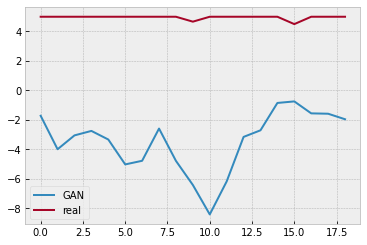

Batch_no: 3000  Epoch: 107


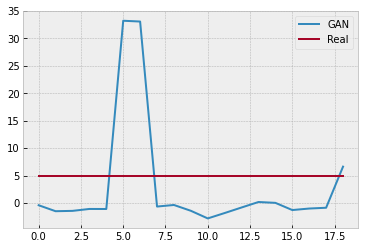

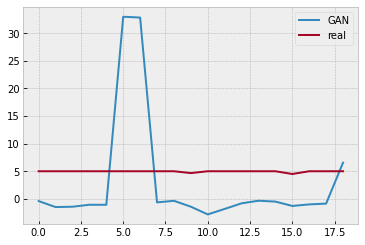

Batch_no: 3500  Epoch: 125


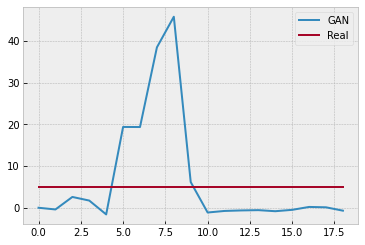

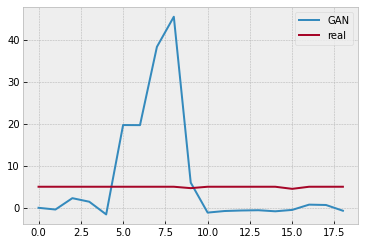

Batch_no: 4000  Epoch: 142


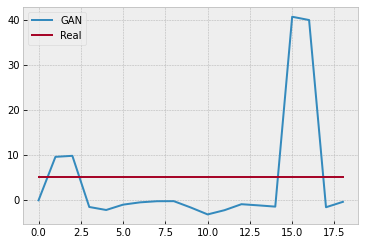

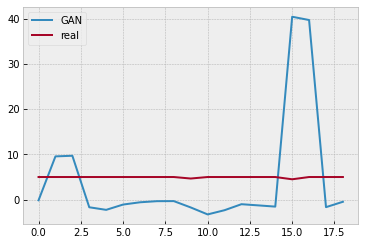

Batch_no: 4500  Epoch: 160


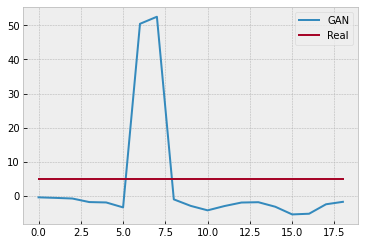

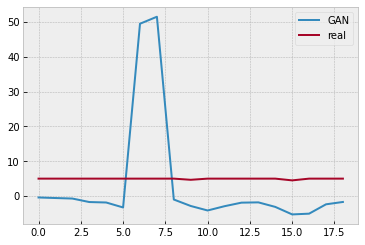

Batch_no: 5000  Epoch: 178


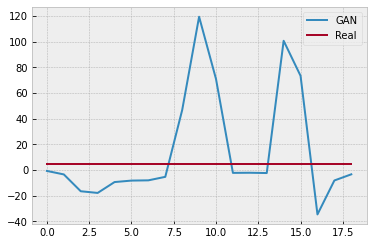

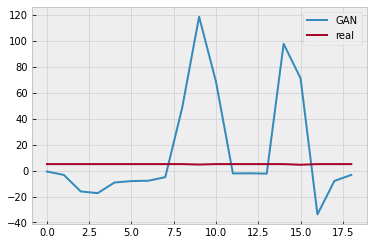

Batch_no: 5500  Epoch: 196


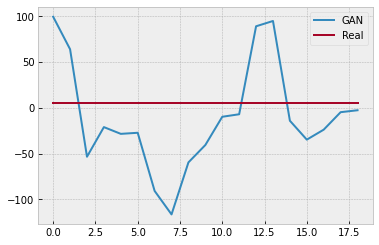

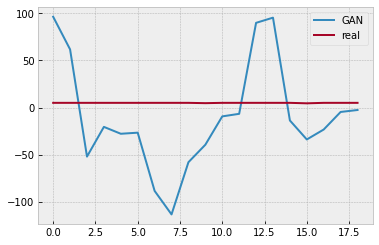

Batch_no: 6000  Epoch: 214


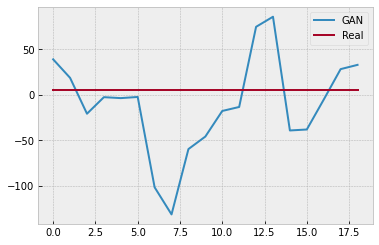

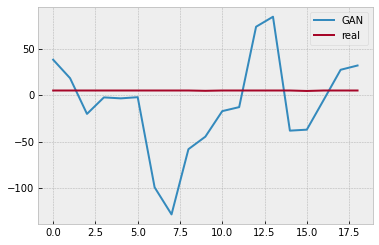

Batch_no: 6500  Epoch: 232


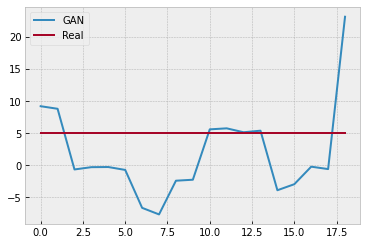

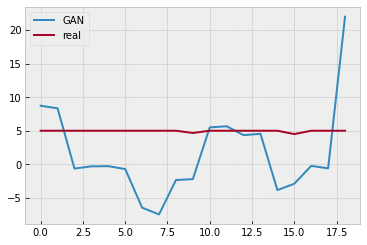

Batch_no: 7000  Epoch: 250


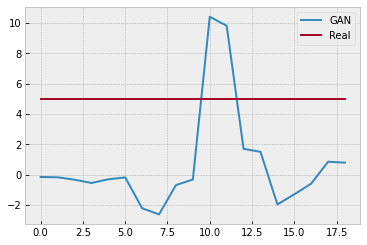

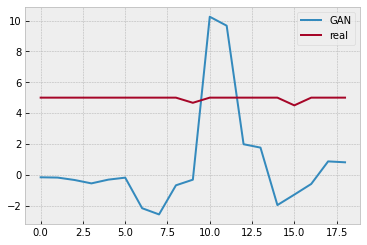

Batch_no: 7500  Epoch: 267


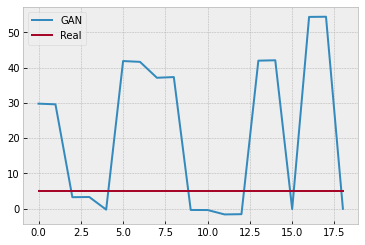

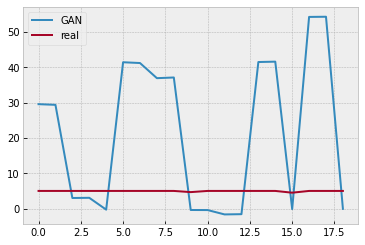

Batch_no: 8000  Epoch: 285


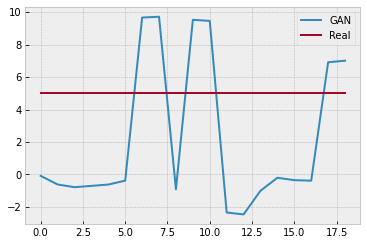

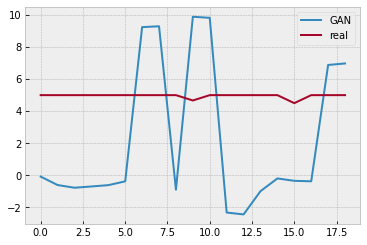

Batch_no: 8500  Epoch: 303


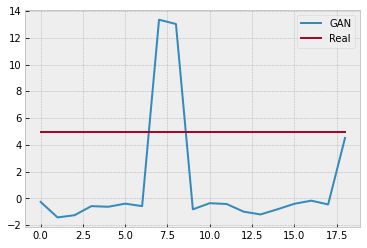

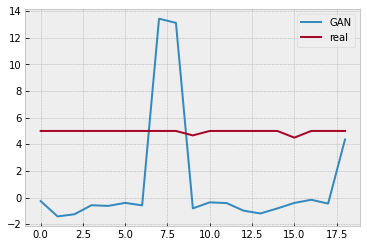

Batch_no: 9000  Epoch: 321


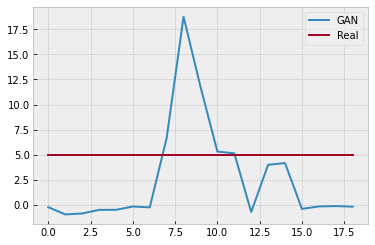

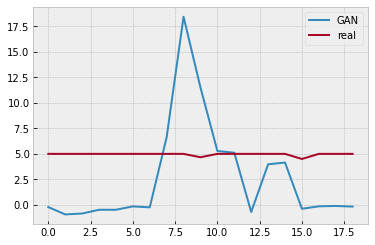

Batch_no: 9500  Epoch: 339


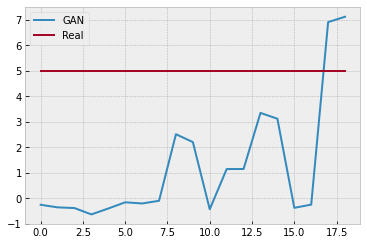

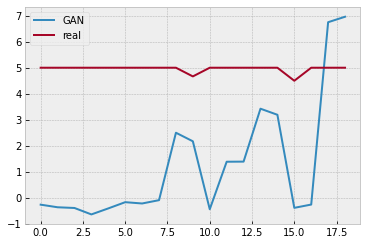

Batch_no: 10000  Epoch: 357


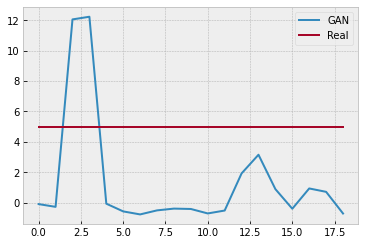

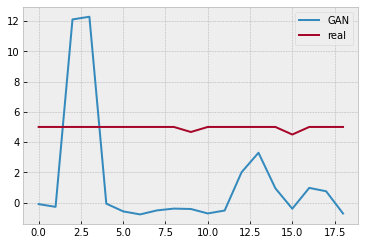

Batch_no: 10500  Epoch: 375


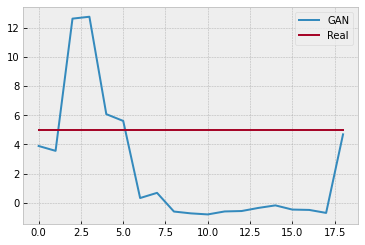

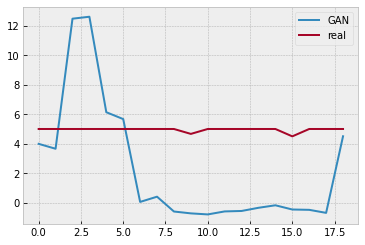

Batch_no: 11000  Epoch: 392


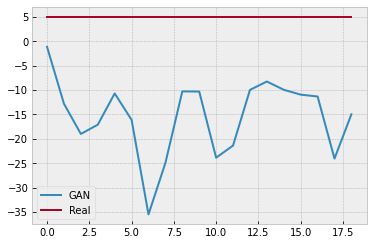

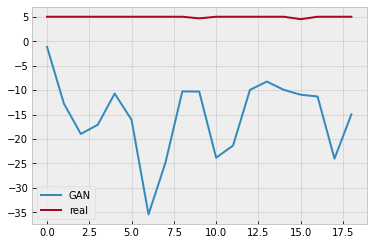

Batch_no: 11500  Epoch: 410


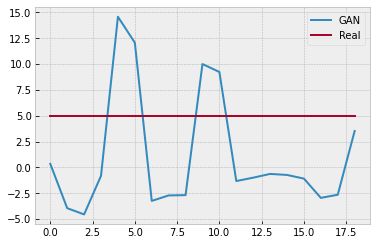

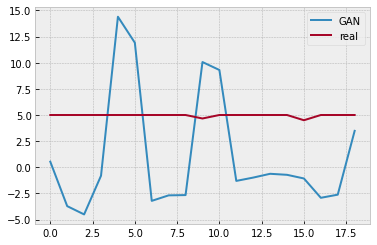

Batch_no: 12000  Epoch: 428


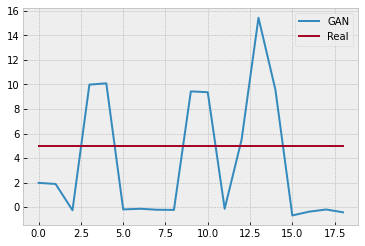

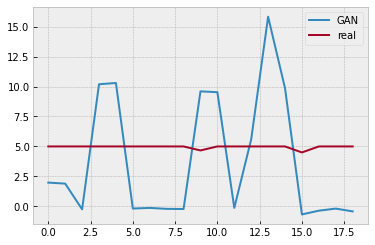

Batch_no: 12500  Epoch: 446


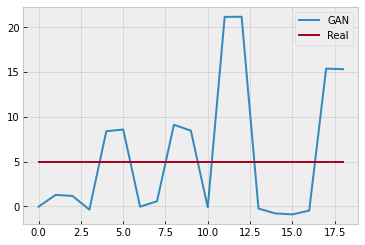

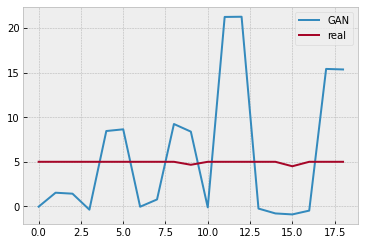

Batch_no: 13000  Epoch: 464


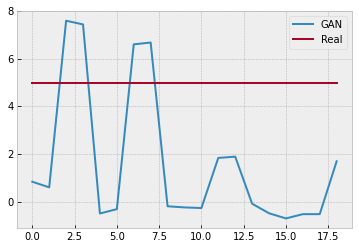

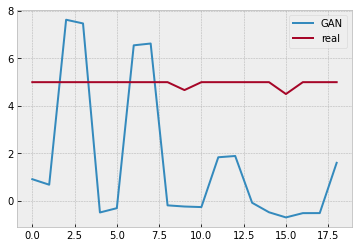

Batch_no: 13500  Epoch: 482


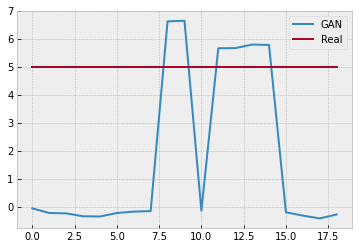

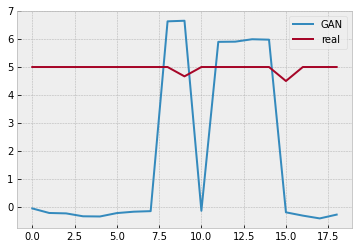

Batch_no: 14000  Epoch: 500


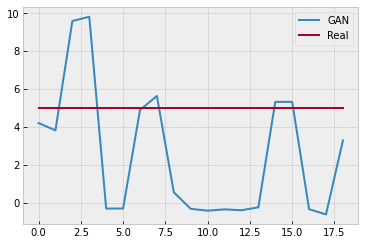

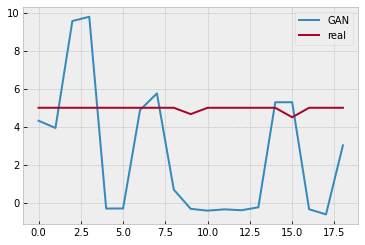

Batch_no: 14500  Epoch: 517


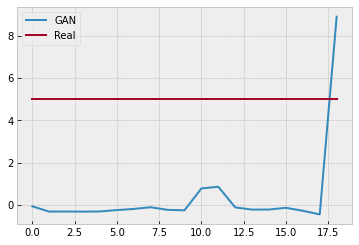

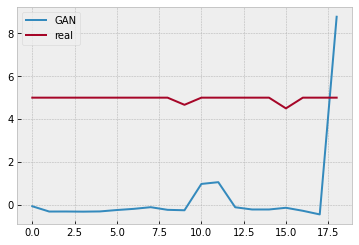

Batch_no: 15000  Epoch: 535


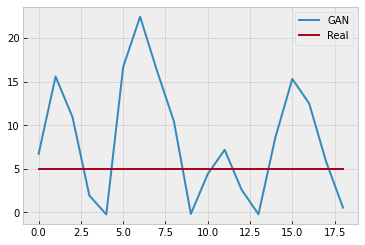

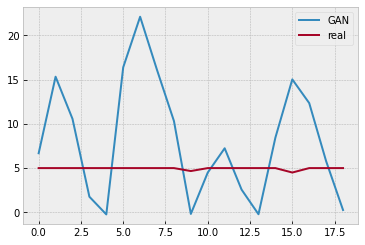

Batch_no: 15500  Epoch: 553


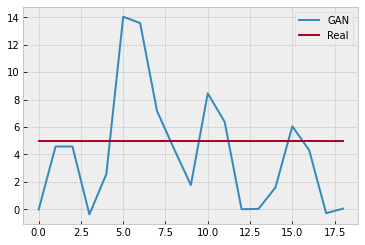

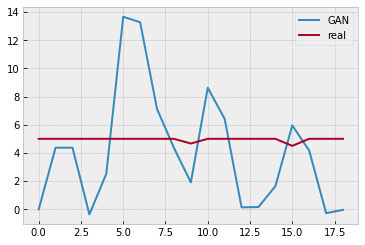

Batch_no: 16000  Epoch: 571


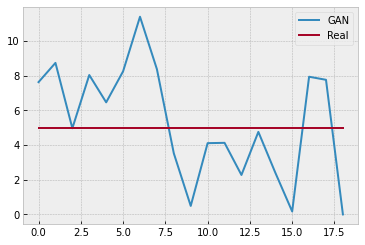

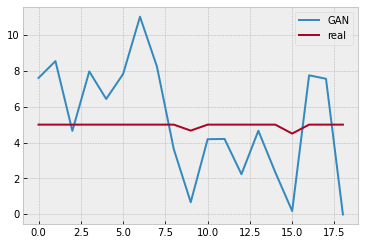

Batch_no: 16500  Epoch: 589


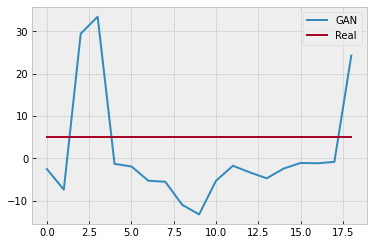

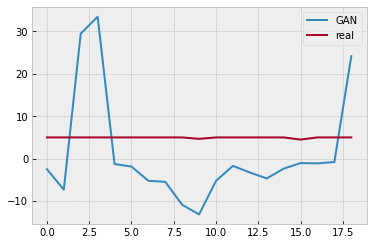

Batch_no: 17000  Epoch: 607


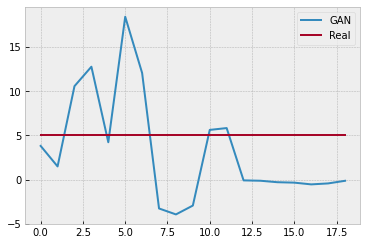

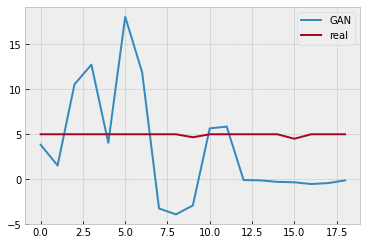

Batch_no: 17500  Epoch: 625


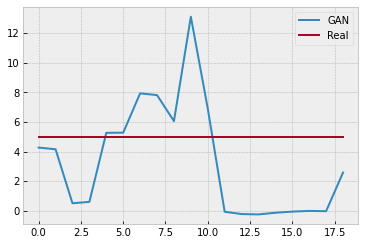

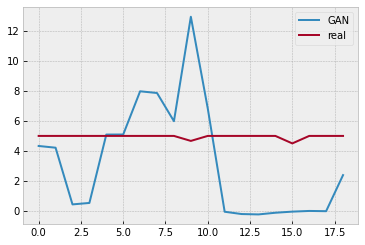

Batch_no: 18000  Epoch: 642


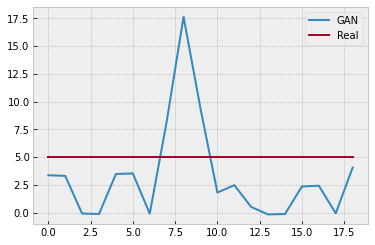

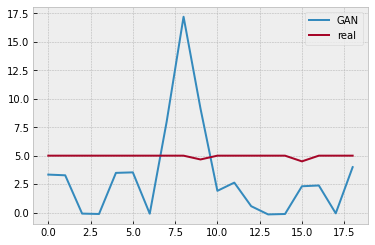

Batch_no: 18500  Epoch: 660


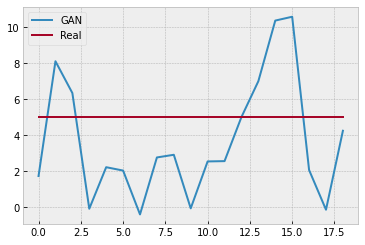

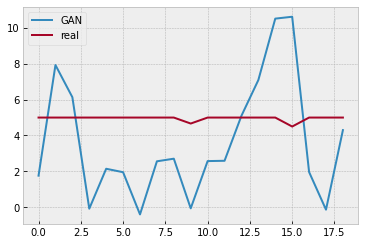

Batch_no: 19000  Epoch: 678


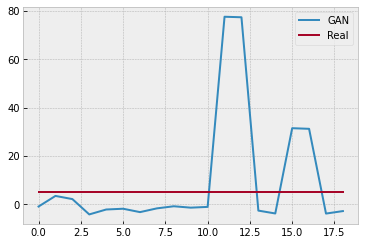

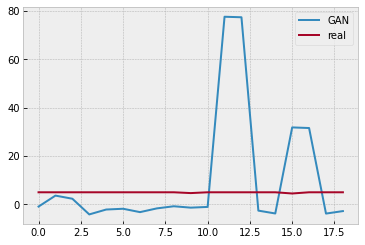

Batch_no: 19500  Epoch: 696


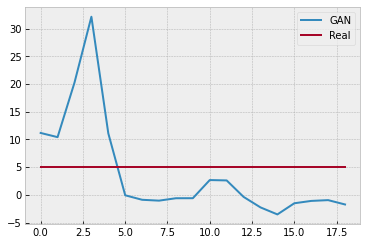

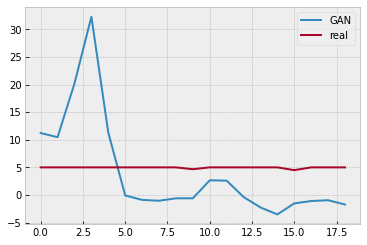

Batch_no: 20000  Epoch: 714


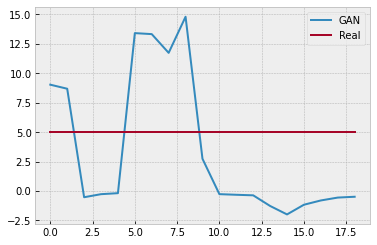

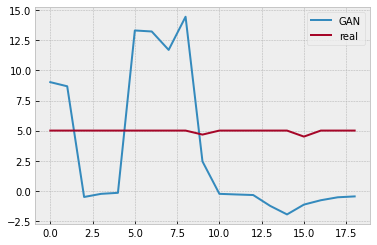

Batch_no: 20500  Epoch: 732


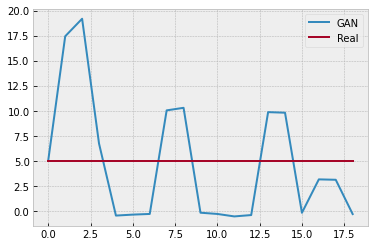

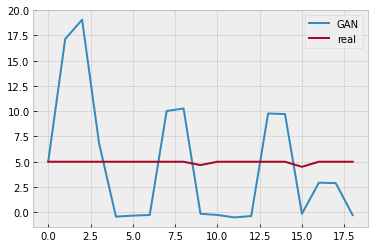

Batch_no: 21000  Epoch: 750


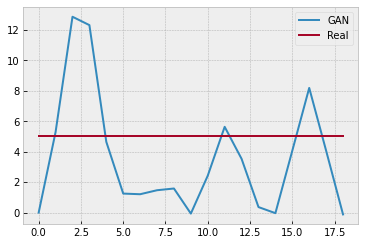

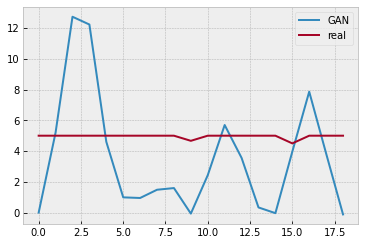

Batch_no: 21500  Epoch: 767


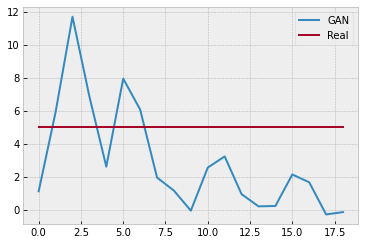

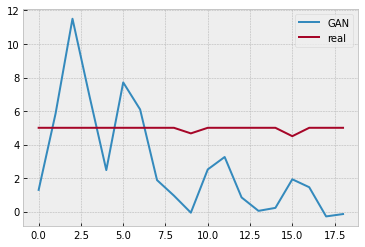

Batch_no: 22000  Epoch: 785


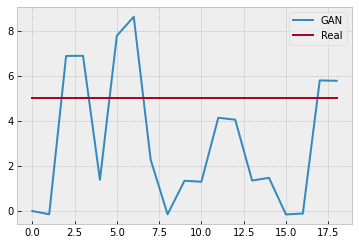

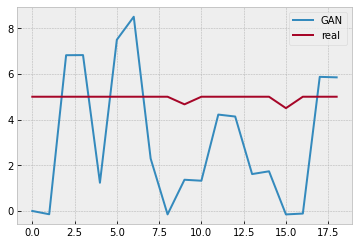

Batch_no: 22500  Epoch: 803


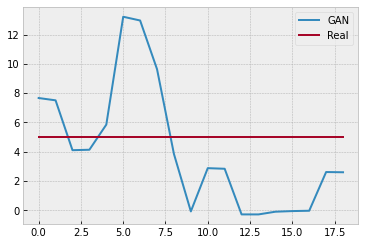

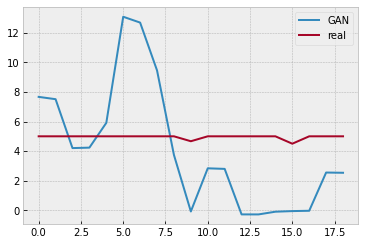

Batch_no: 23000  Epoch: 821


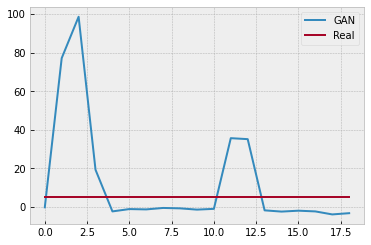

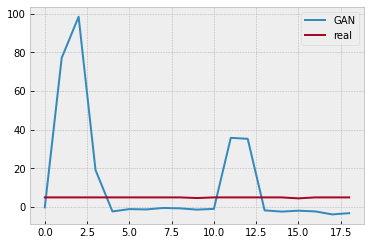

Batch_no: 23500  Epoch: 839


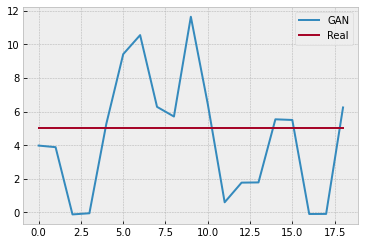

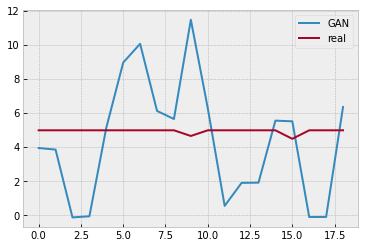

Batch_no: 24000  Epoch: 857


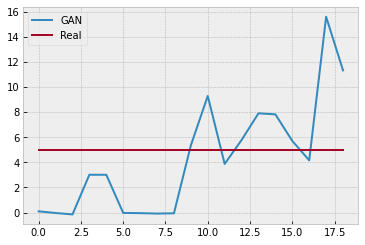

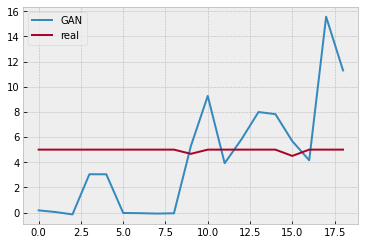

Batch_no: 24500  Epoch: 875


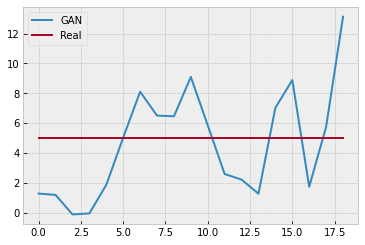

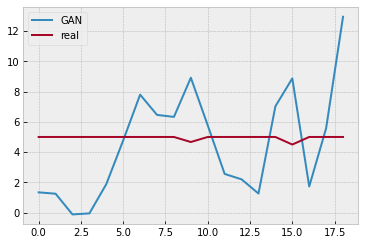

Batch_no: 25000  Epoch: 892


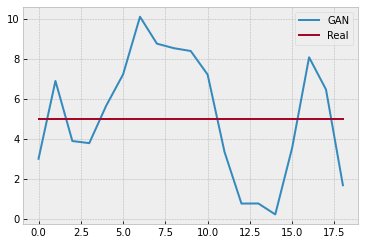

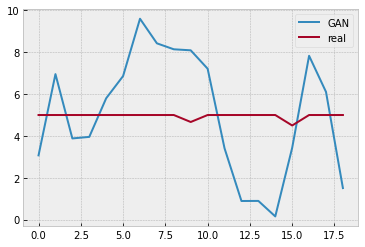

Batch_no: 25500  Epoch: 910


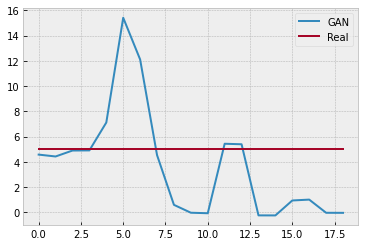

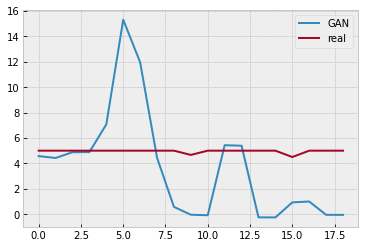

Batch_no: 26000  Epoch: 928


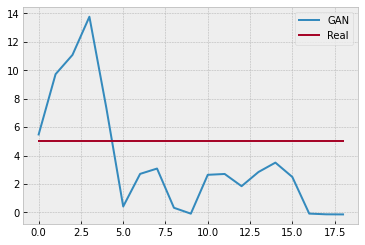

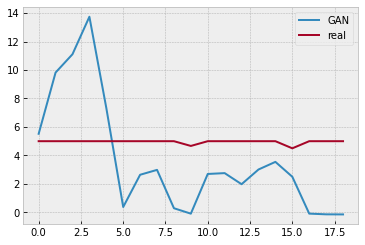

Batch_no: 26500  Epoch: 946


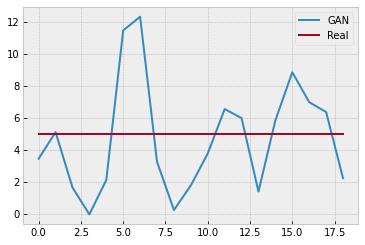

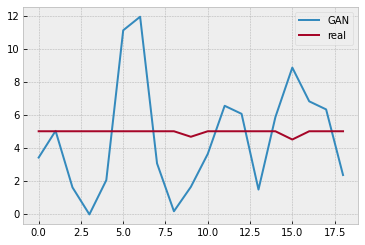

Batch_no: 27000  Epoch: 964


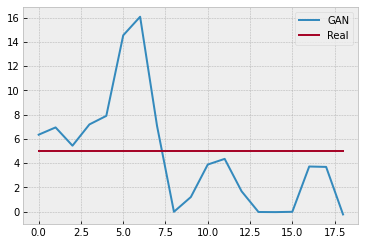

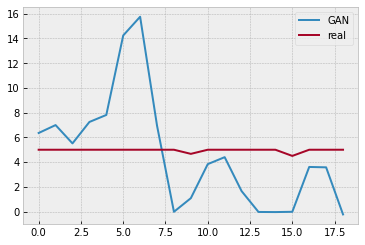

Batch_no: 27500  Epoch: 982


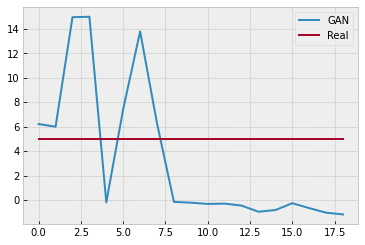

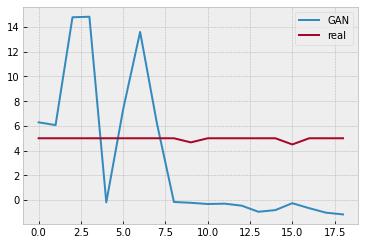

Batch_no: 28000  Epoch: 1000


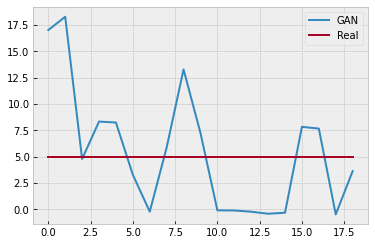

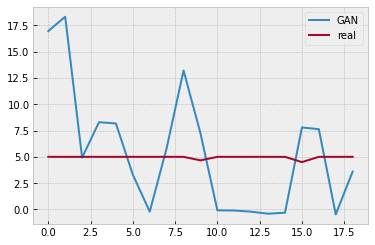

Batch_no: 28500  Epoch: 1017


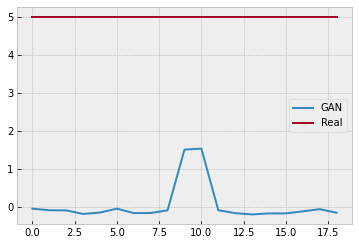

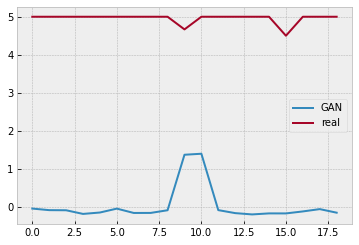

Batch_no: 29000  Epoch: 1035


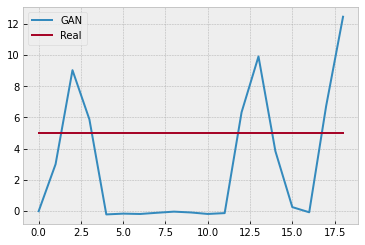

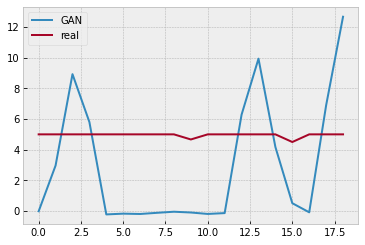

Batch_no: 29500  Epoch: 1053


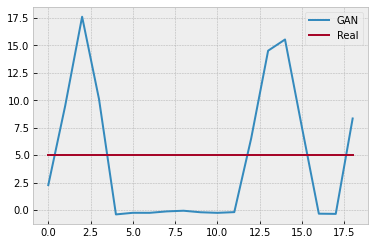

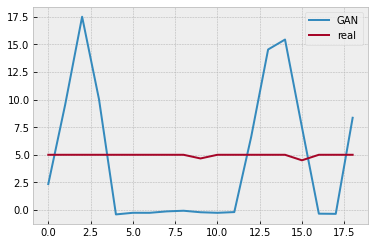

Batch_no: 30000  Epoch: 1071


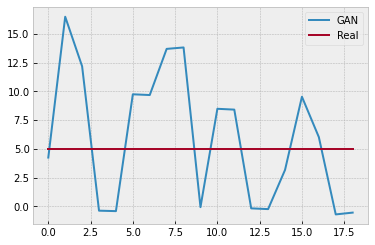

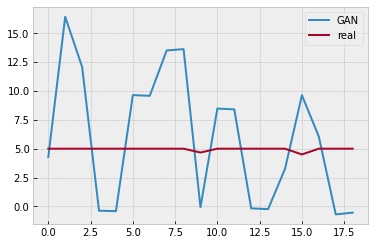

Batch_no: 30500  Epoch: 1089


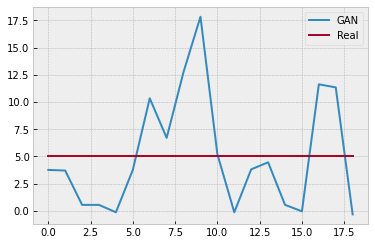

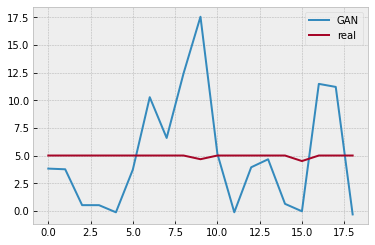

Batch_no: 31000  Epoch: 1107


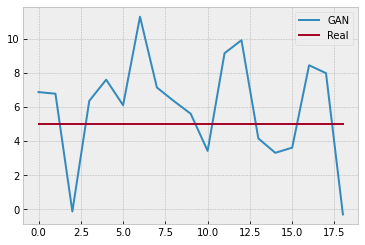

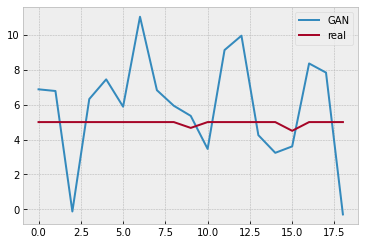

Batch_no: 31500  Epoch: 1125


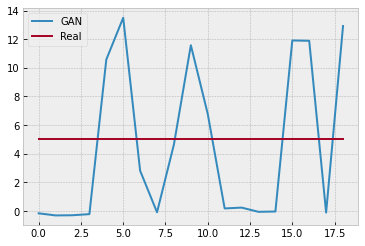

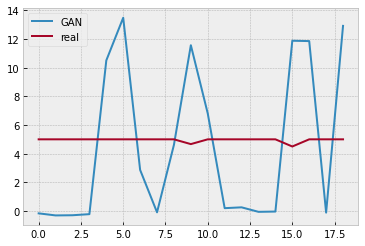

Batch_no: 32000  Epoch: 1142


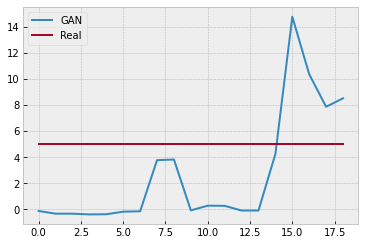

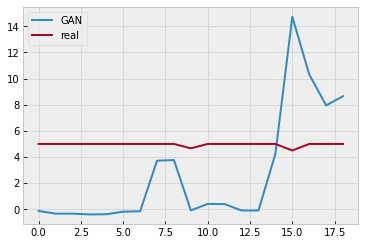

Batch_no: 32500  Epoch: 1160


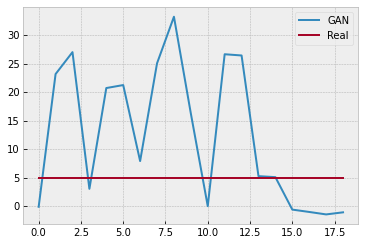

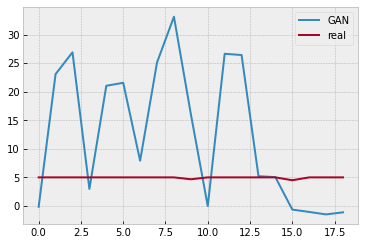

Batch_no: 33000  Epoch: 1178


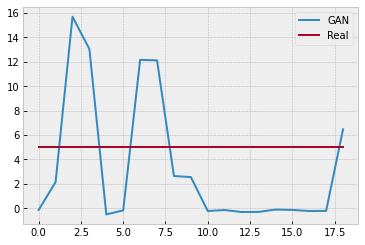

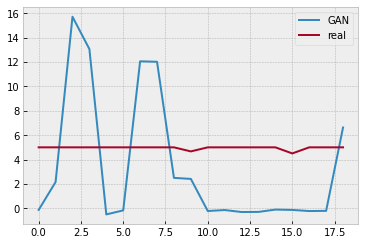

Batch_no: 33500  Epoch: 1196


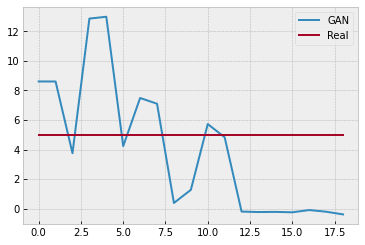

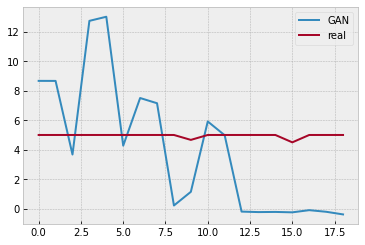

Batch_no: 34000  Epoch: 1214


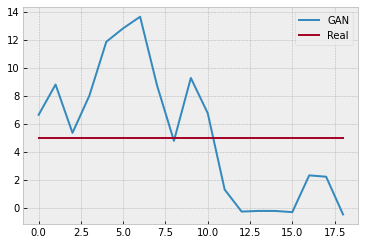

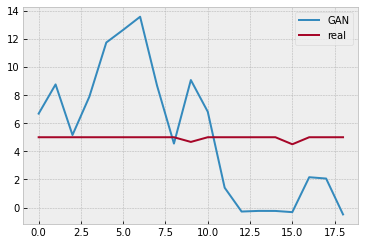

Batch_no: 34500  Epoch: 1232


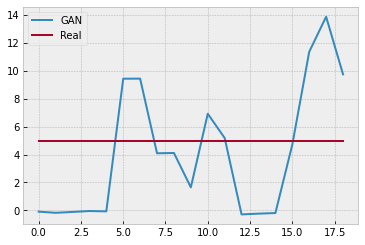

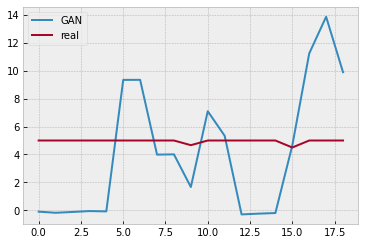

Batch_no: 35000  Epoch: 1250


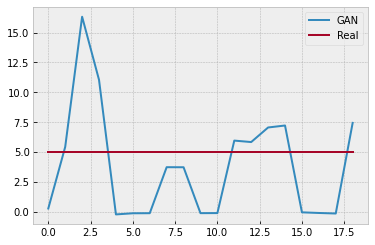

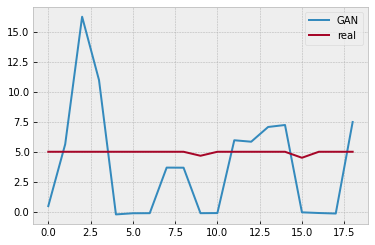

Batch_no: 35500  Epoch: 1267


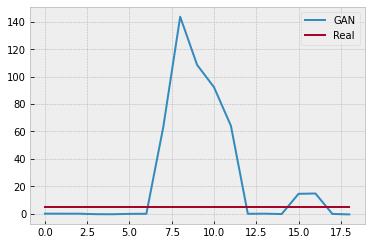

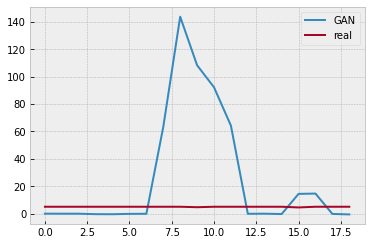

Batch_no: 36000  Epoch: 1285


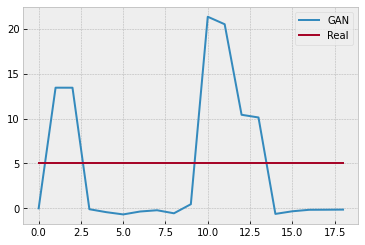

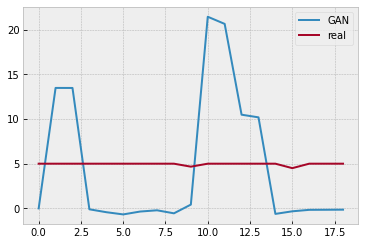

Batch_no: 36500  Epoch: 1303


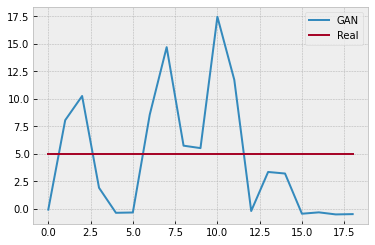

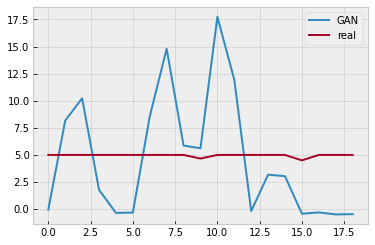

Batch_no: 37000  Epoch: 1321


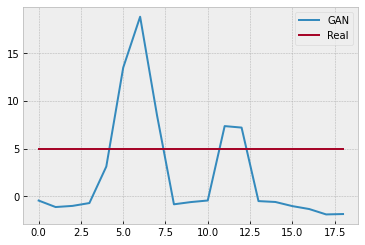

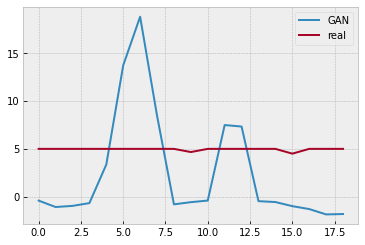

Batch_no: 37500  Epoch: 1339


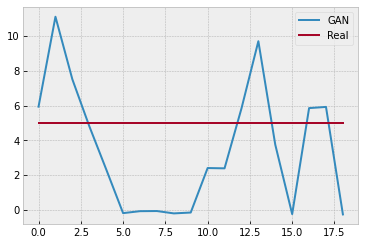

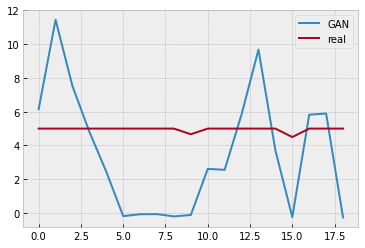

Batch_no: 38000  Epoch: 1357


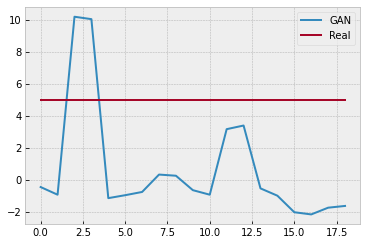

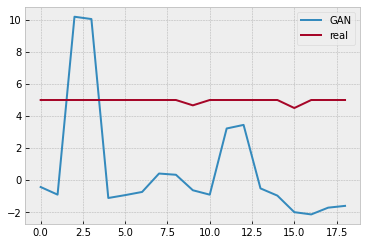

Batch_no: 38500  Epoch: 1375


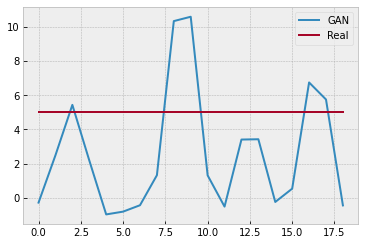

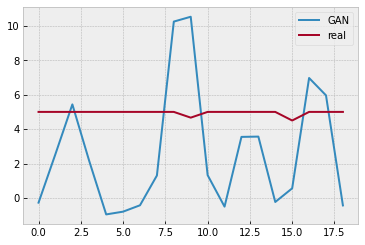

Batch_no: 39000  Epoch: 1392


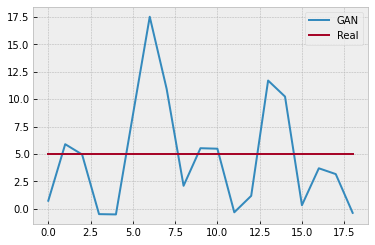

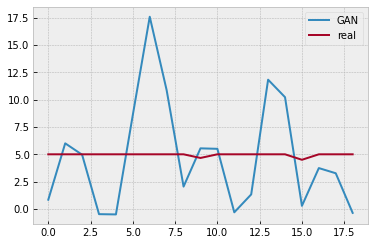

Batch_no: 39500  Epoch: 1410


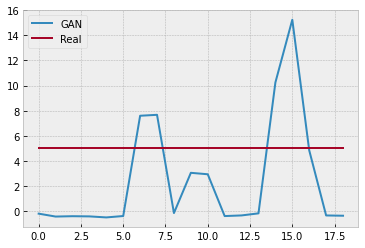

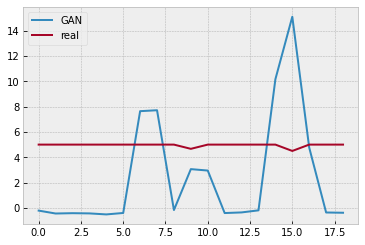

Batch_no: 40000  Epoch: 1428


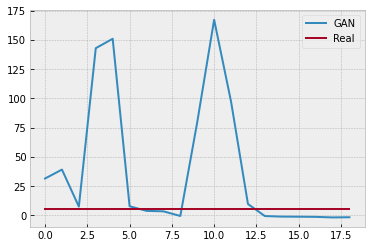

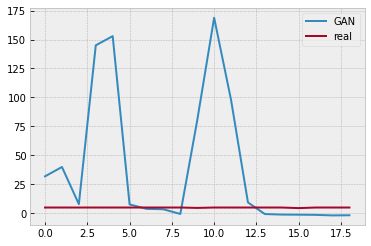

Batch_no: 40500  Epoch: 1446


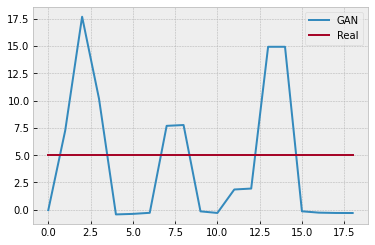

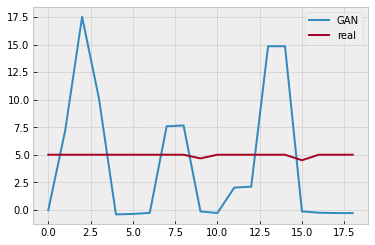

Batch_no: 41000  Epoch: 1464


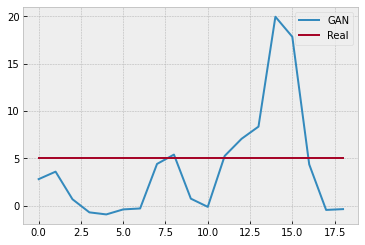

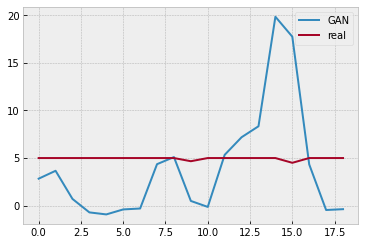

Batch_no: 41500  Epoch: 1482


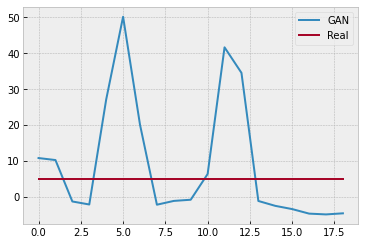

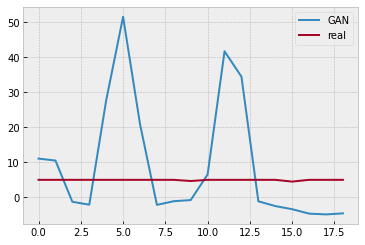

Batch_no: 42000  Epoch: 1500


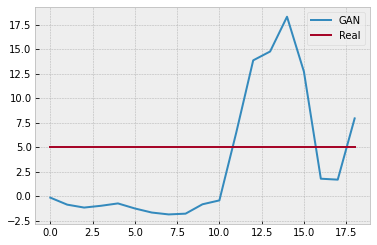

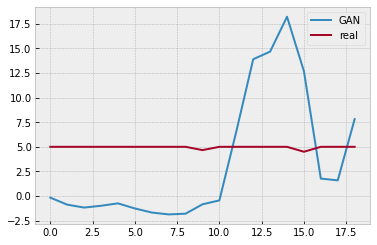

Batch_no: 42500  Epoch: 1517


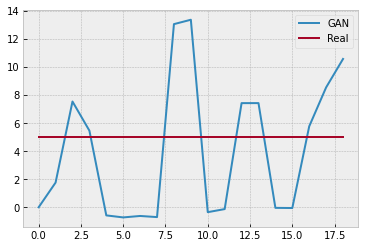

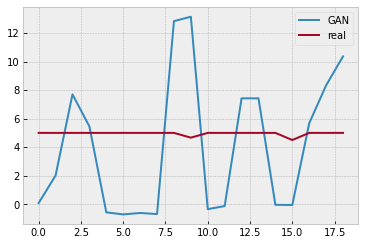

Batch_no: 43000  Epoch: 1535


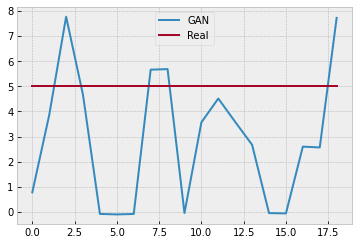

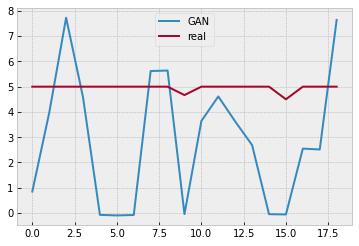

Batch_no: 43500  Epoch: 1553


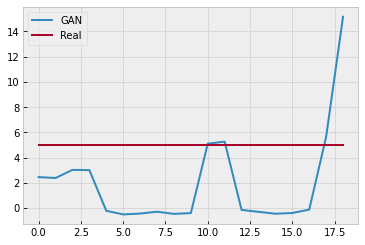

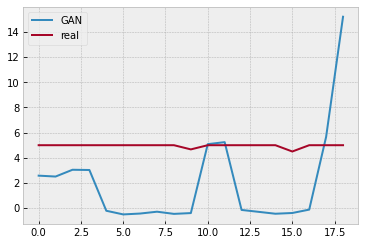

Batch_no: 44000  Epoch: 1571


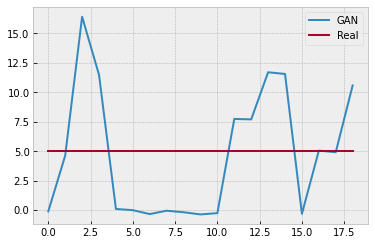

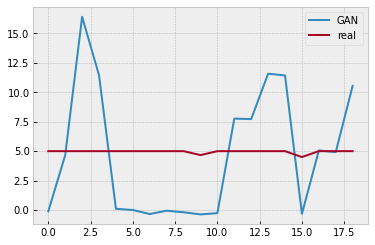

Batch_no: 44500  Epoch: 1589


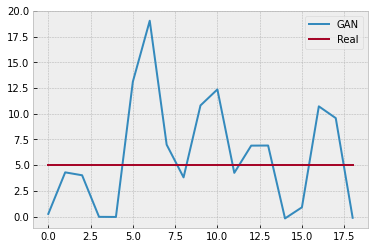

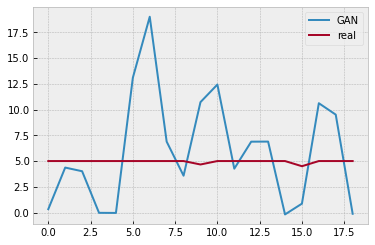

Batch_no: 45000  Epoch: 1607


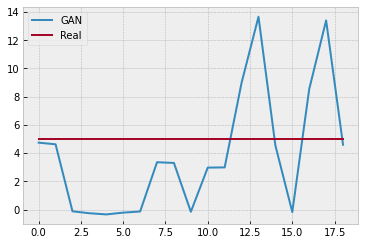

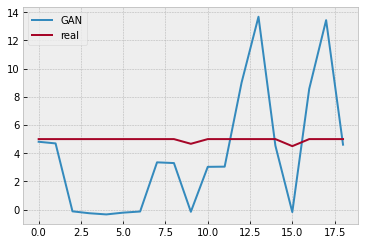

Batch_no: 45500  Epoch: 1625


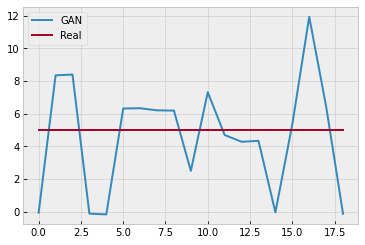

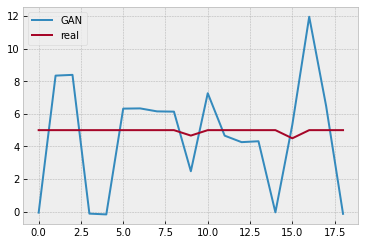

Batch_no: 46000  Epoch: 1642


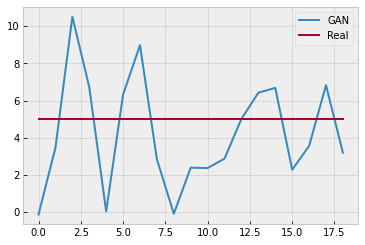

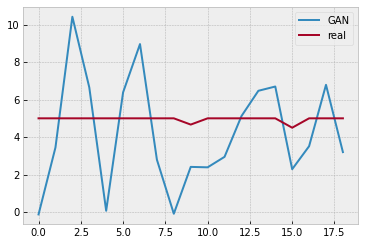

Batch_no: 46500  Epoch: 1660


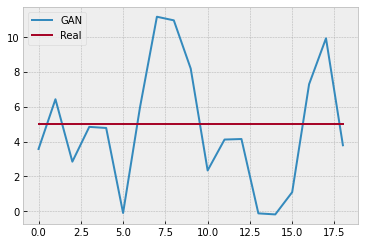

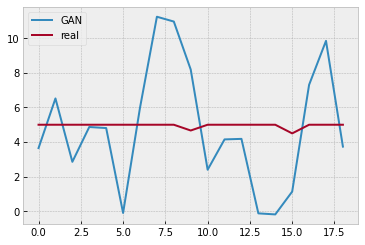

Batch_no: 47000  Epoch: 1678


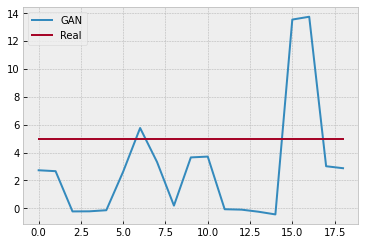

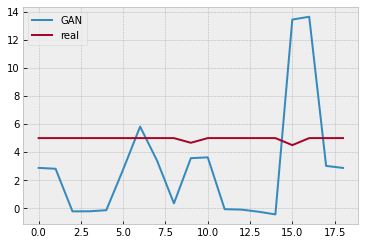

Batch_no: 47500  Epoch: 1696


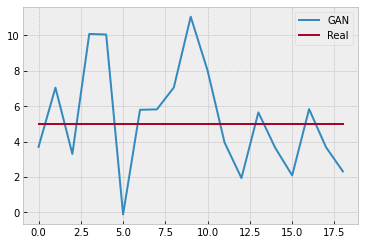

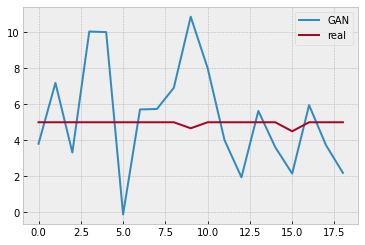

Batch_no: 48000  Epoch: 1714


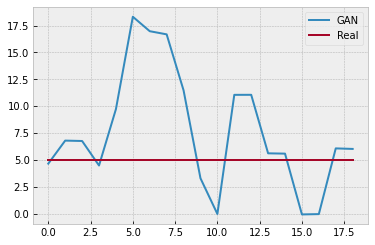

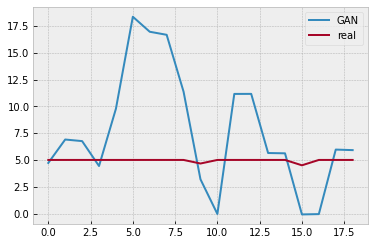

Batch_no: 48500  Epoch: 1732


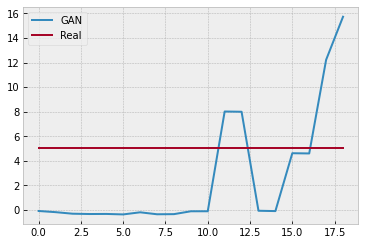

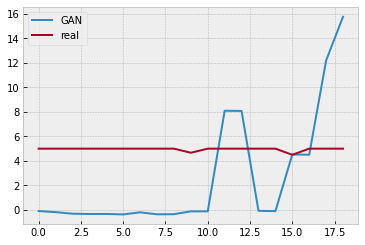

Batch_no: 49000  Epoch: 1750


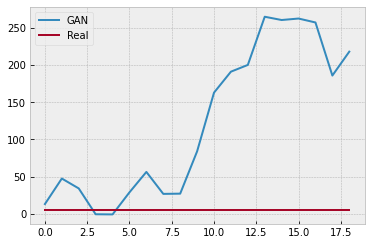

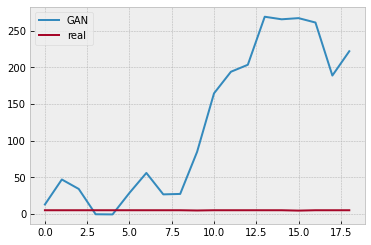

Batch_no: 49500  Epoch: 1767


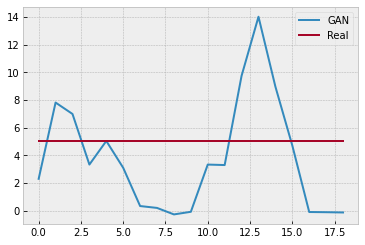

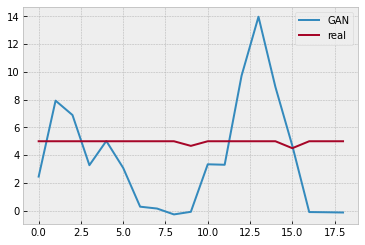

Batch_no: 50000  Epoch: 1785


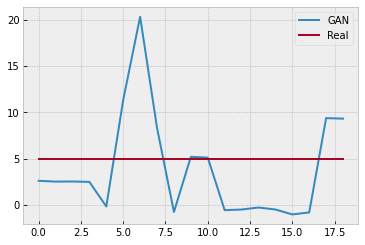

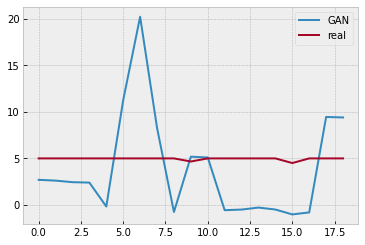

Batch_no: 50500  Epoch: 1803


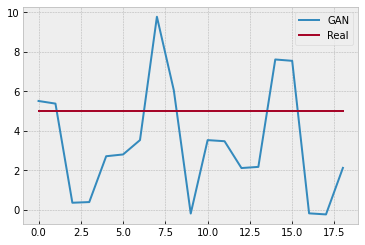

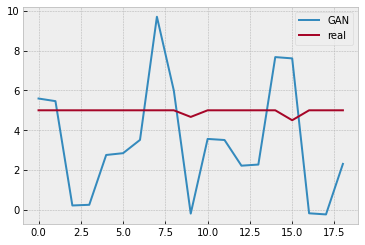

Batch_no: 51000  Epoch: 1821


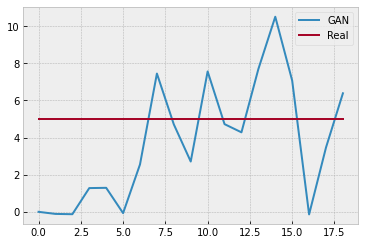

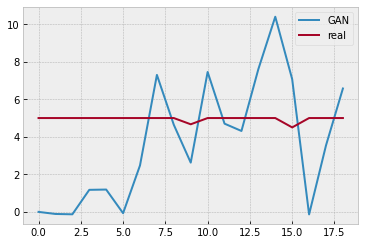

Batch_no: 51500  Epoch: 1839


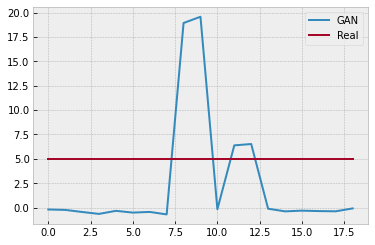

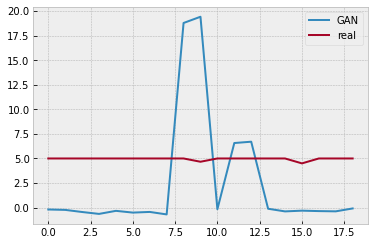

Batch_no: 52000  Epoch: 1857


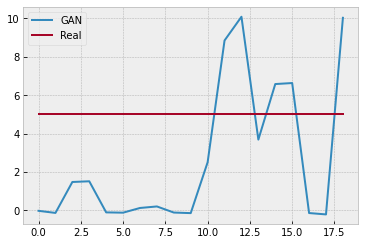

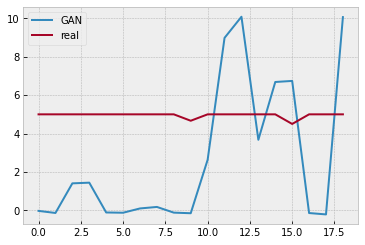

Batch_no: 52500  Epoch: 1875


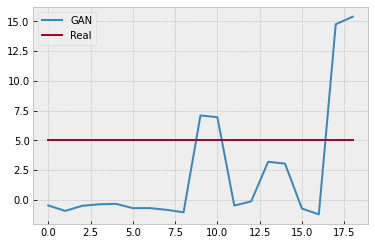

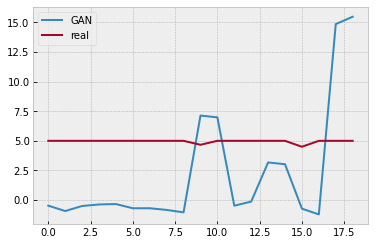

Batch_no: 53000  Epoch: 1892


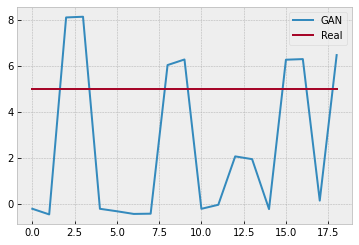

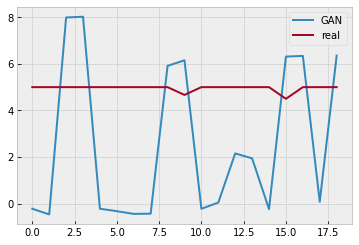

Batch_no: 53500  Epoch: 1910


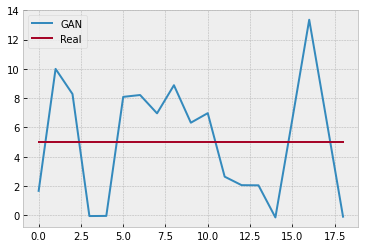

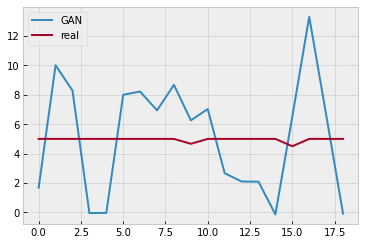

Batch_no: 54000  Epoch: 1928


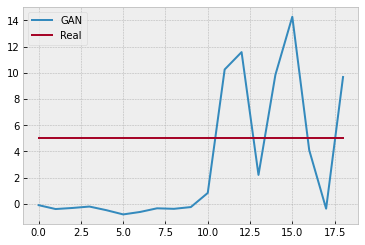

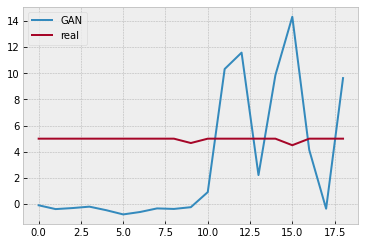

Batch_no: 54500  Epoch: 1946


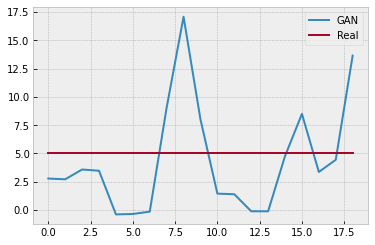

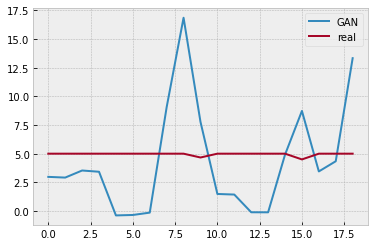

Batch_no: 55000  Epoch: 1964


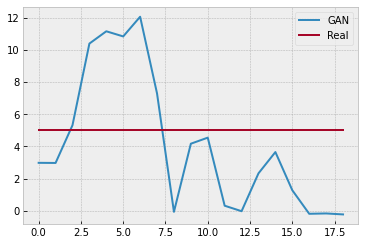

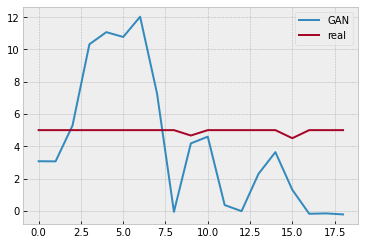

Batch_no: 55500  Epoch: 1982


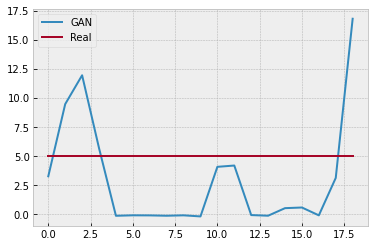

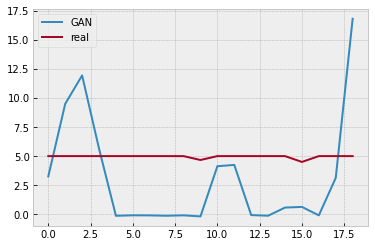

Batch_no: 56000  Epoch: 2000


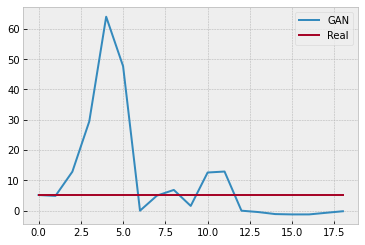

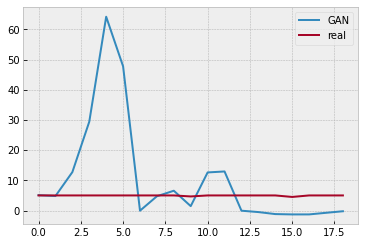

Batch_no: 56500  Epoch: 2017


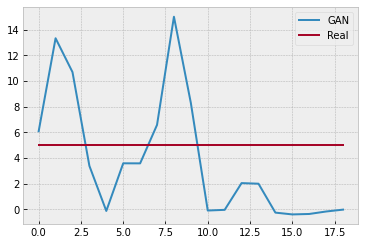

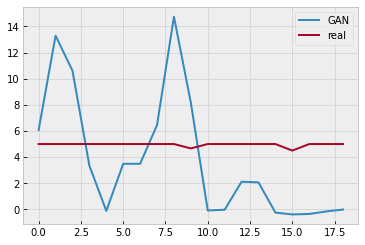

Batch_no: 57000  Epoch: 2035


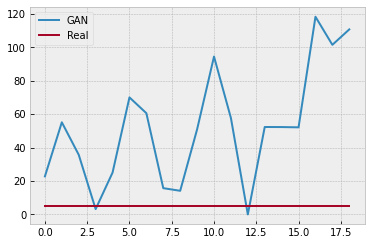

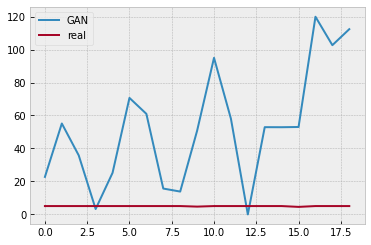

Batch_no: 57500  Epoch: 2053


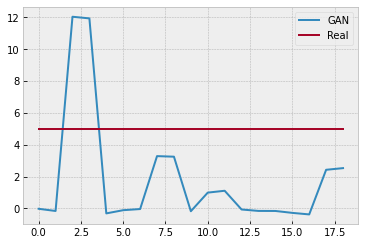

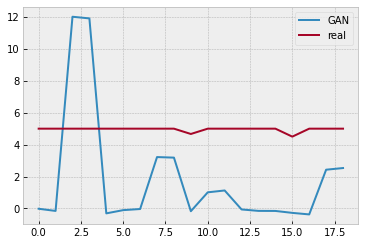

Batch_no: 58000  Epoch: 2071


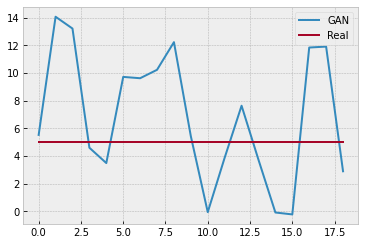

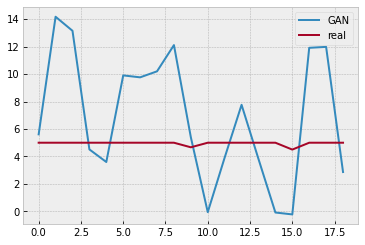

Batch_no: 58500  Epoch: 2089


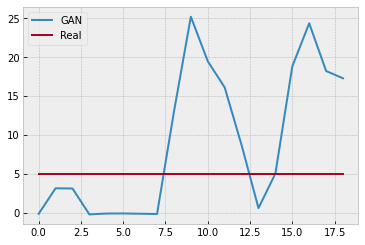

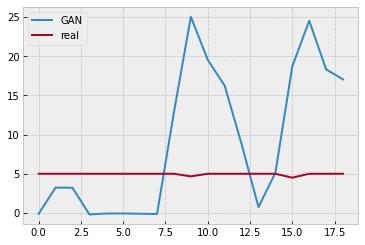

Batch_no: 59000  Epoch: 2107


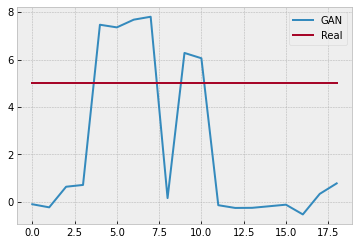

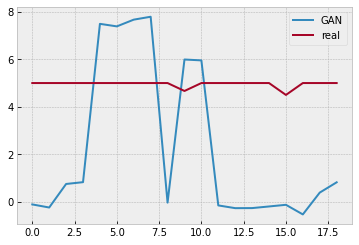

Batch_no: 59500  Epoch: 2125


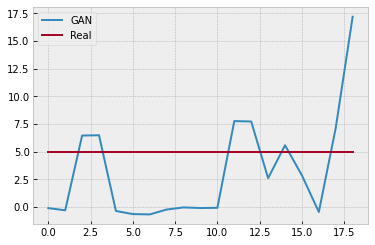

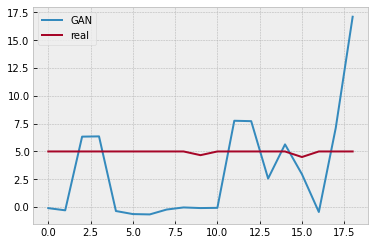

Batch_no: 60000  Epoch: 2142


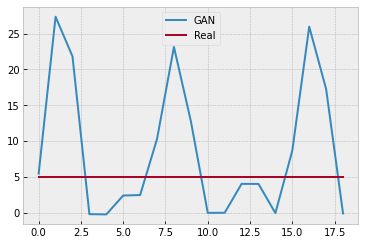

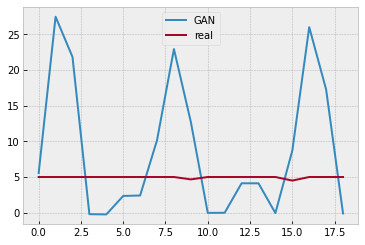

Batch_no: 60500  Epoch: 2160


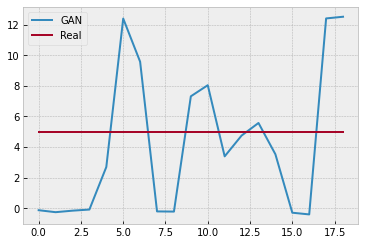

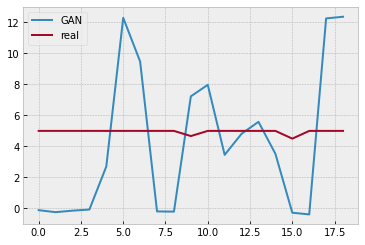

Batch_no: 61000  Epoch: 2178


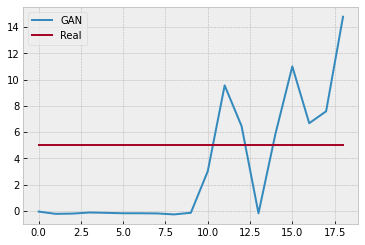

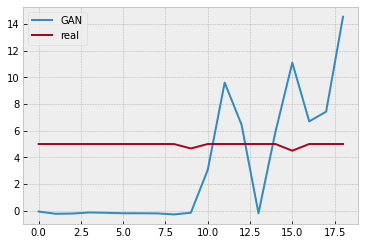

Batch_no: 61500  Epoch: 2196


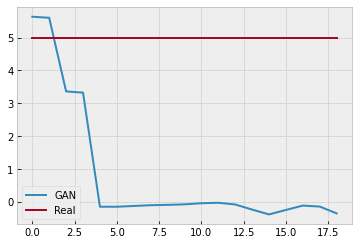

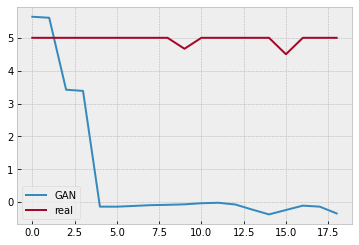

Batch_no: 62000  Epoch: 2214


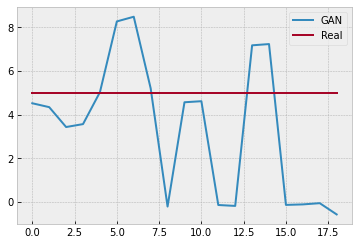

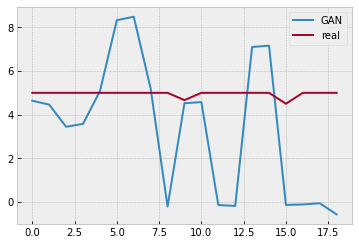

Batch_no: 62500  Epoch: 2232


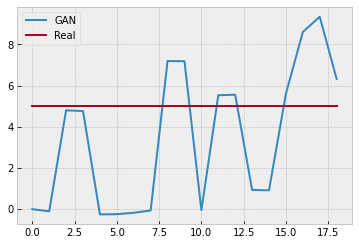

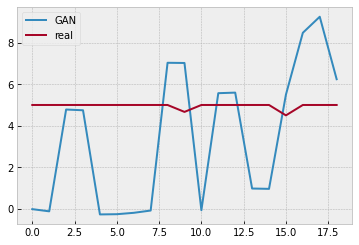

Batch_no: 63000  Epoch: 2250


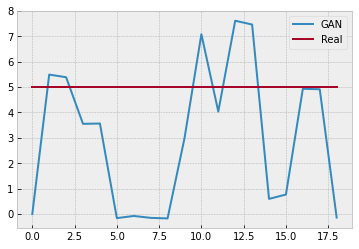

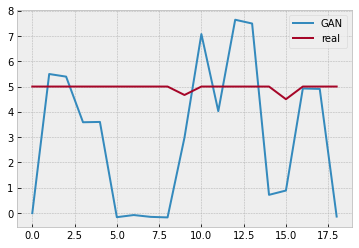

Batch_no: 63500  Epoch: 2267


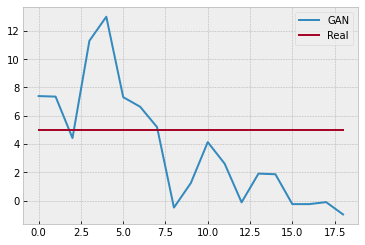

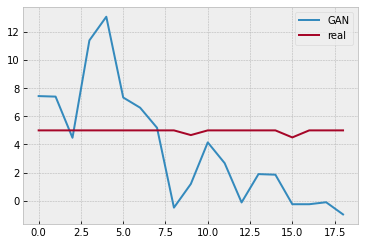

Batch_no: 64000  Epoch: 2285


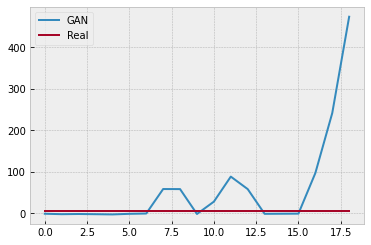

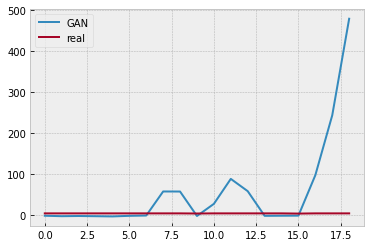

Batch_no: 64500  Epoch: 2303


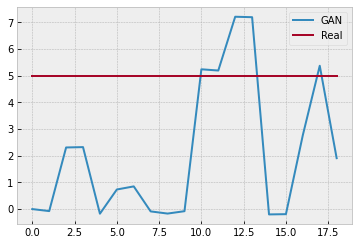

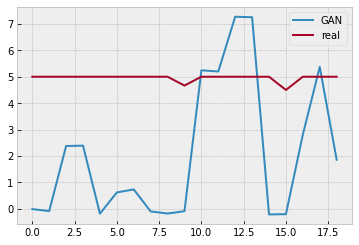

Batch_no: 65000  Epoch: 2321


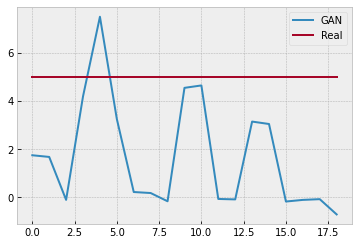

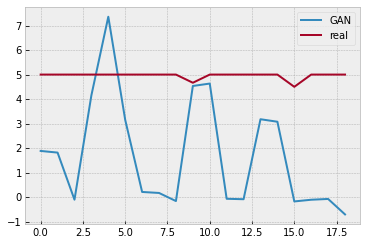

Batch_no: 65500  Epoch: 2339


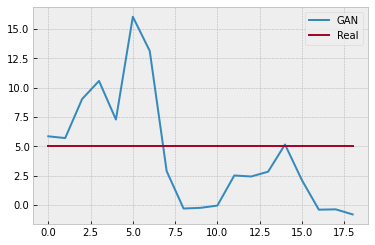

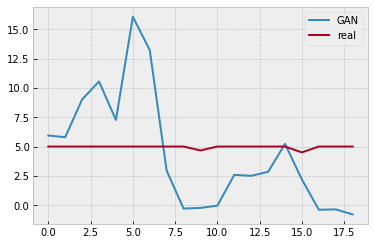

Batch_no: 66000  Epoch: 2357


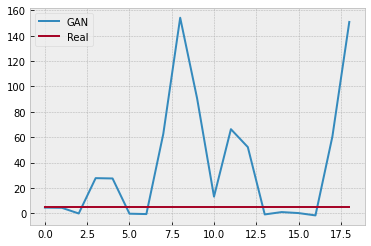

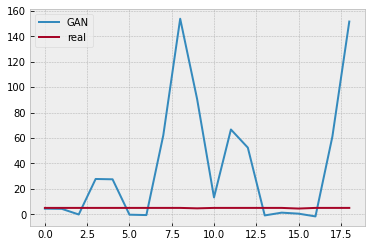

Batch_no: 66500  Epoch: 2375


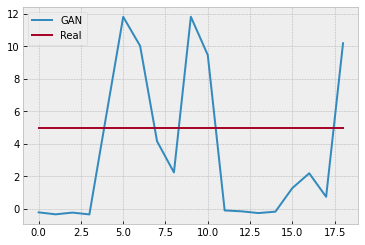

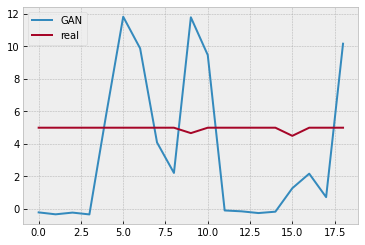

Batch_no: 67000  Epoch: 2392


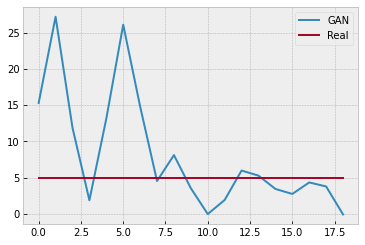

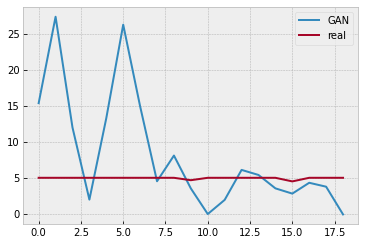

Batch_no: 67500  Epoch: 2410


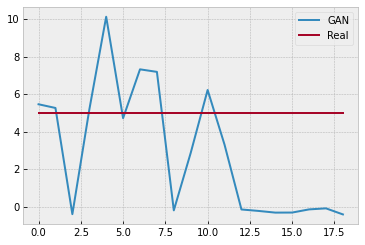

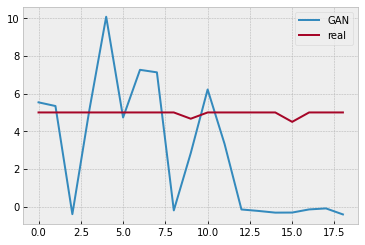

Batch_no: 68000  Epoch: 2428


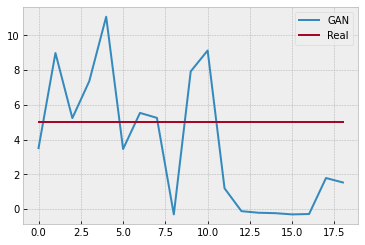

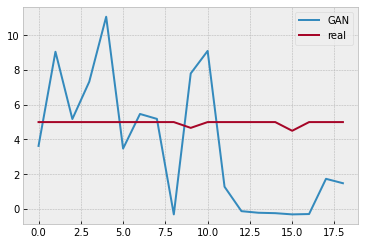

Batch_no: 68500  Epoch: 2446


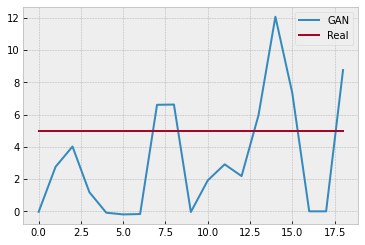

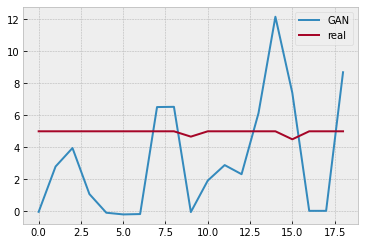

Batch_no: 69000  Epoch: 2464


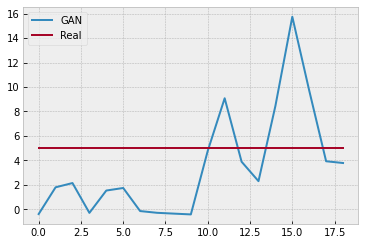

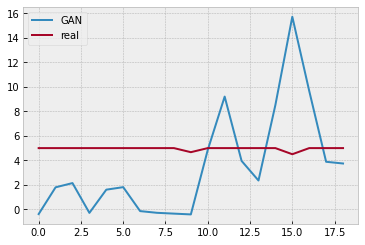

Batch_no: 69500  Epoch: 2482


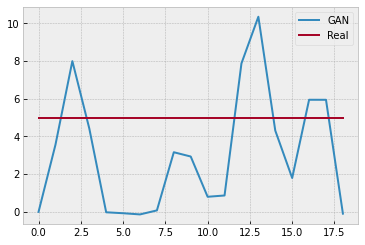

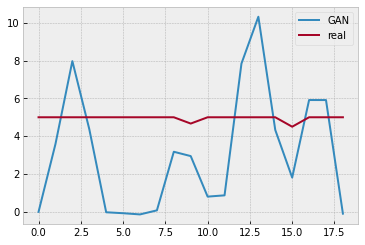

Batch_no: 70000  Epoch: 2500


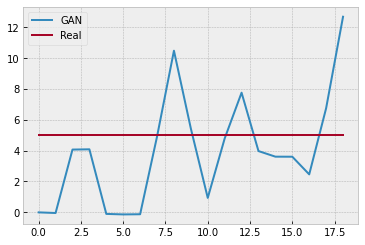

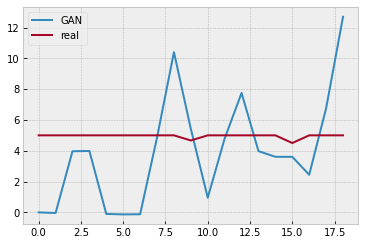

Batch_no: 70500  Epoch: 2517


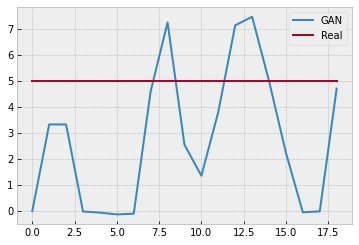

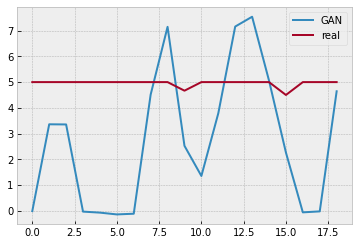

Batch_no: 71000  Epoch: 2535


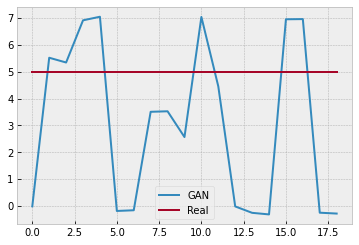

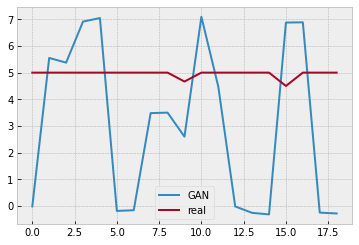

Batch_no: 71500  Epoch: 2553


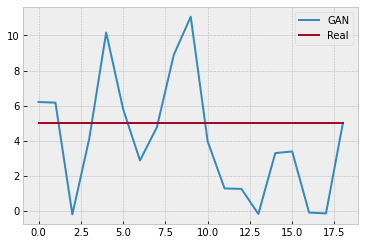

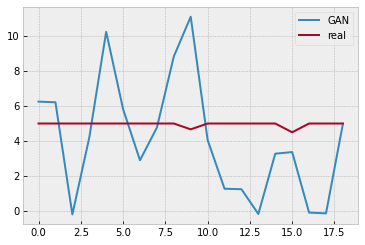

Batch_no: 72000  Epoch: 2571


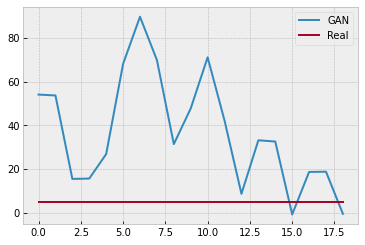

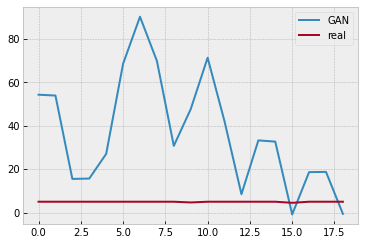

Batch_no: 72500  Epoch: 2589


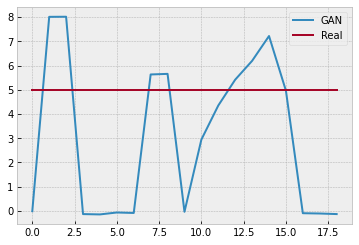

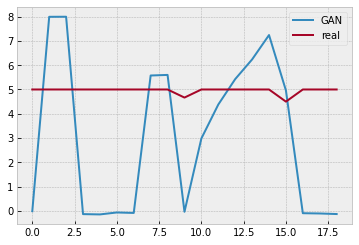

Batch_no: 73000  Epoch: 2607


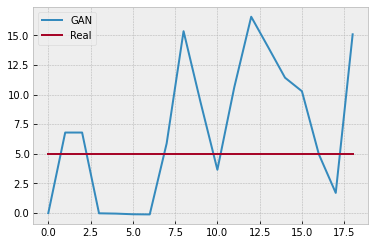

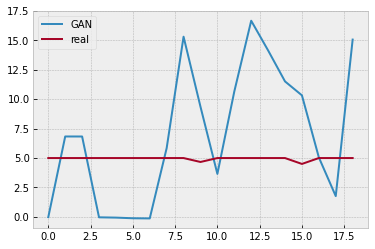

Batch_no: 73500  Epoch: 2625


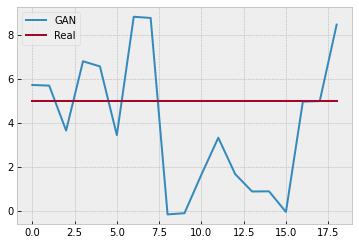

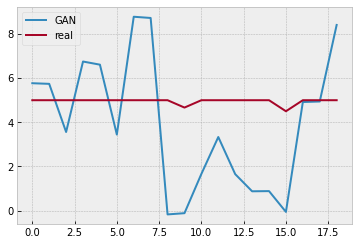

Batch_no: 74000  Epoch: 2642


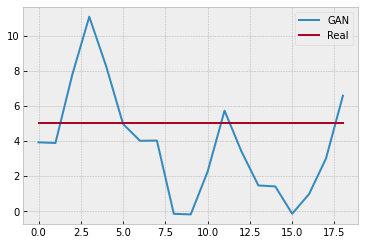

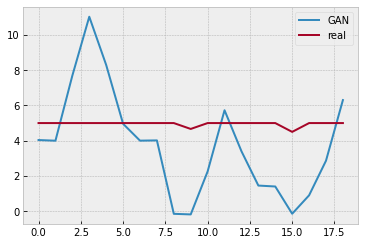

Batch_no: 74500  Epoch: 2660


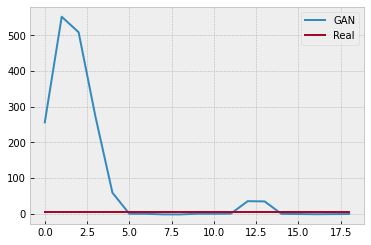

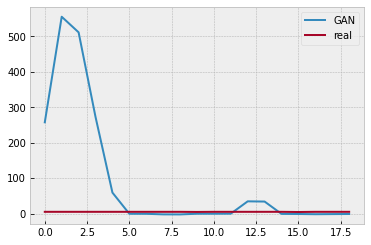

Batch_no: 75000  Epoch: 2678


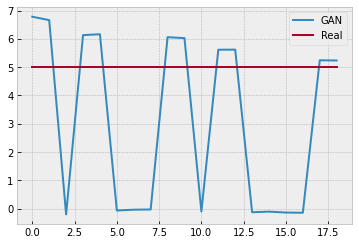

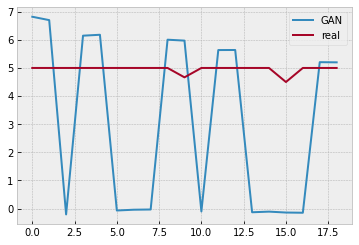

Batch_no: 75500  Epoch: 2696


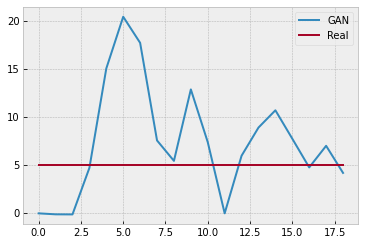

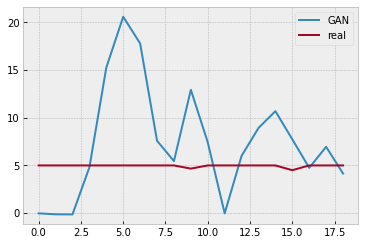

Batch_no: 76000  Epoch: 2714


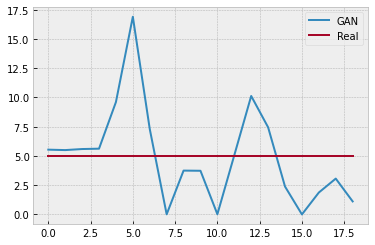

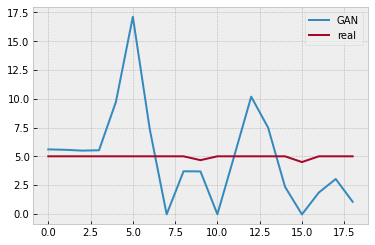

Batch_no: 76500  Epoch: 2732


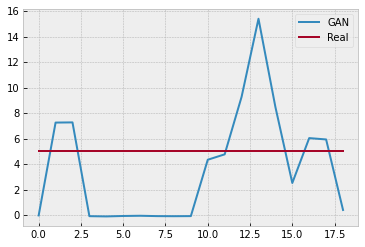

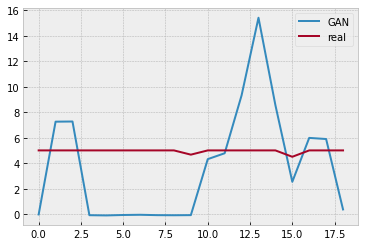

Batch_no: 77000  Epoch: 2750


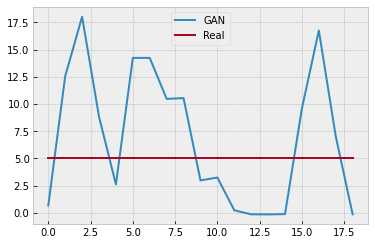

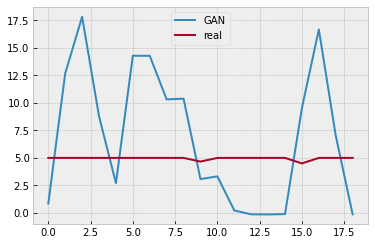

Batch_no: 77500  Epoch: 2767


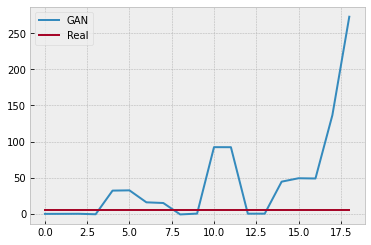

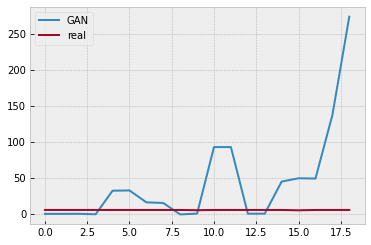

Batch_no: 78000  Epoch: 2785


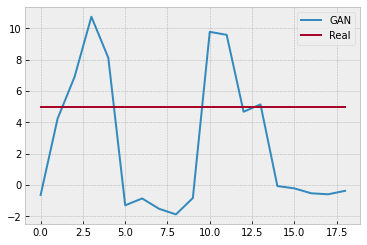

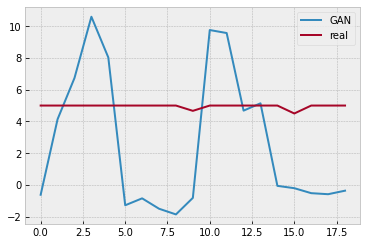

Batch_no: 78500  Epoch: 2803


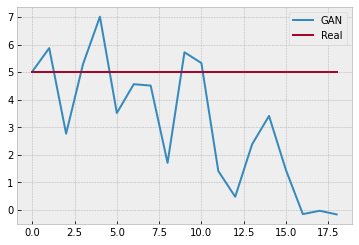

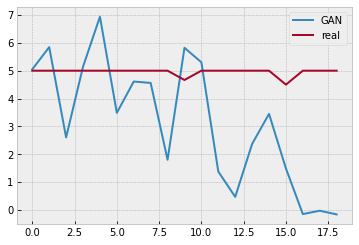

Batch_no: 79000  Epoch: 2821


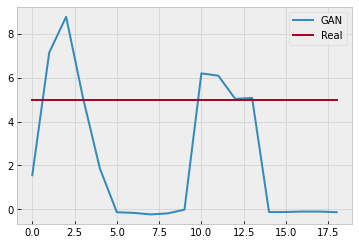

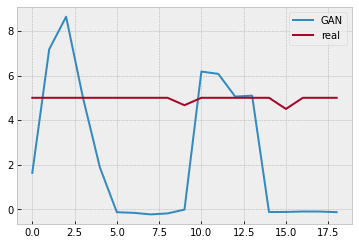

Batch_no: 79500  Epoch: 2839


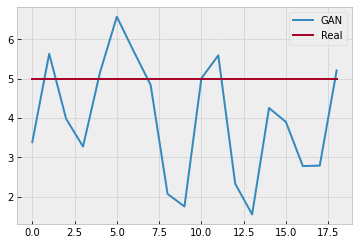

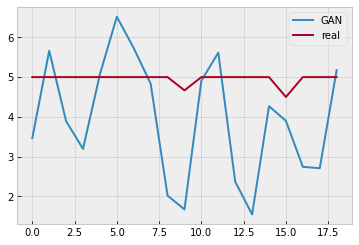

Batch_no: 80000  Epoch: 2857


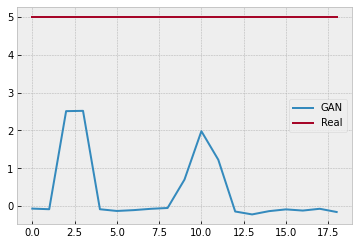

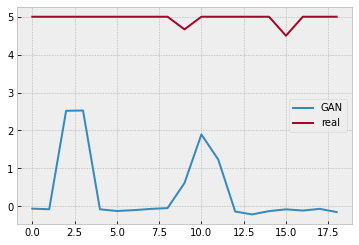

Batch_no: 80500  Epoch: 2875


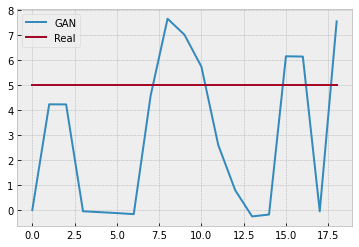

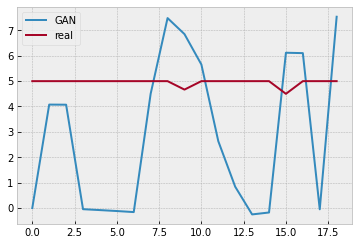

Batch_no: 81000  Epoch: 2892


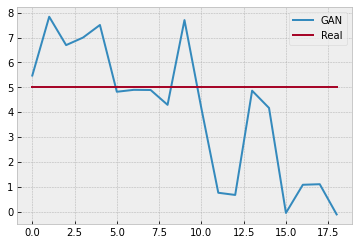

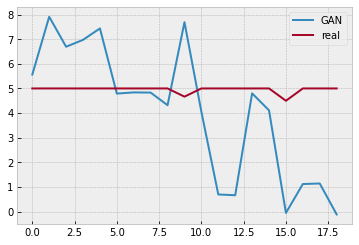

Batch_no: 81500  Epoch: 2910


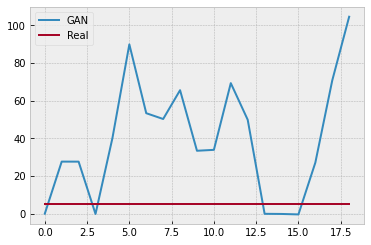

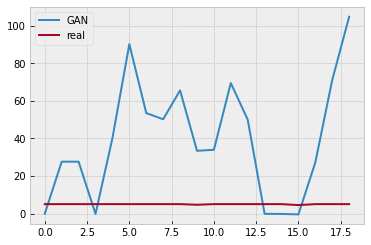

Batch_no: 82000  Epoch: 2928


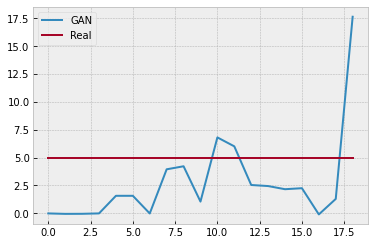

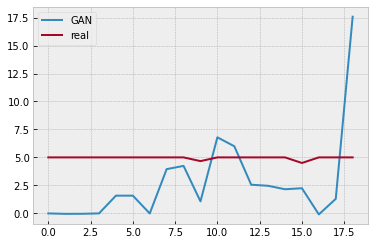

Batch_no: 82500  Epoch: 2946


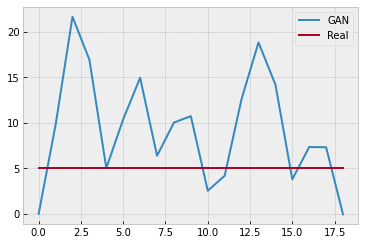

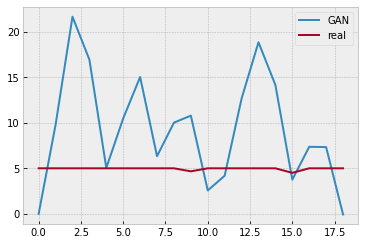

Batch_no: 83000  Epoch: 2964


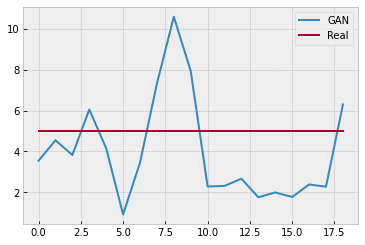

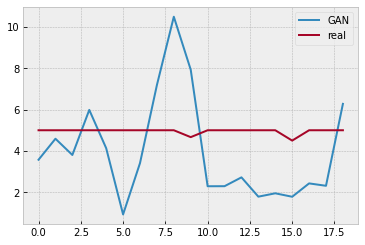

Batch_no: 83500  Epoch: 2982


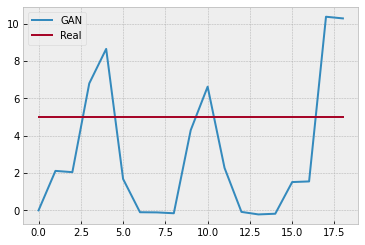

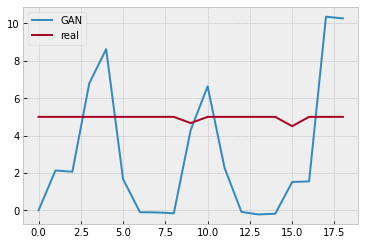

Batch_no: 84000  Epoch: 3000


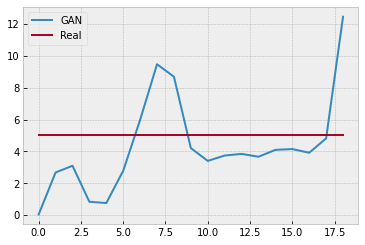

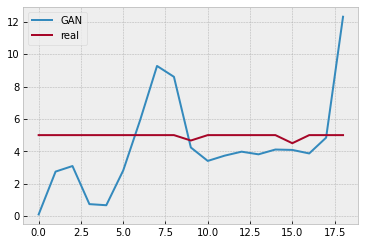

Batch_no: 84500  Epoch: 3017


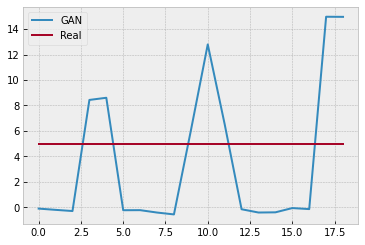

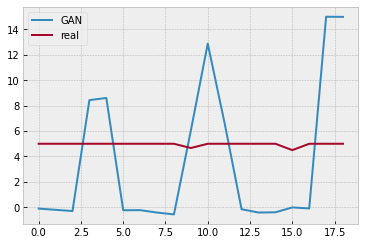

Batch_no: 85000  Epoch: 3035


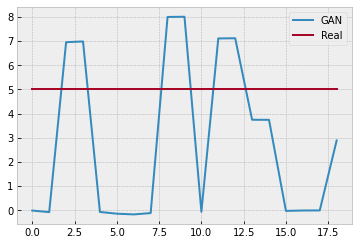

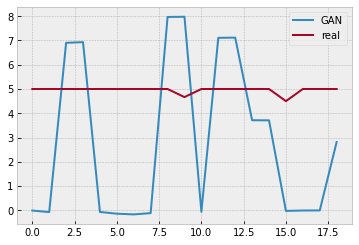

Batch_no: 85500  Epoch: 3053


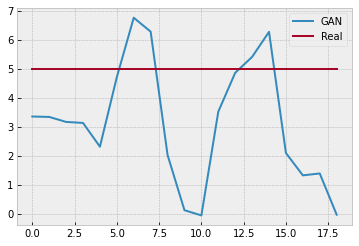

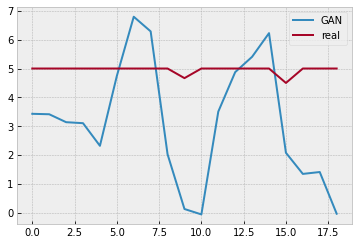

Batch_no: 86000  Epoch: 3071


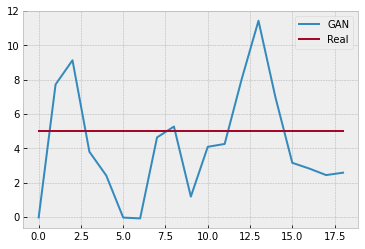

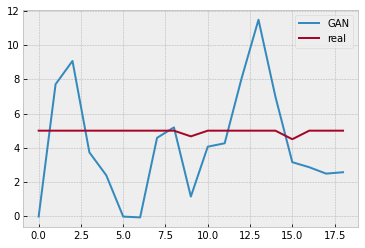

Batch_no: 86500  Epoch: 3089


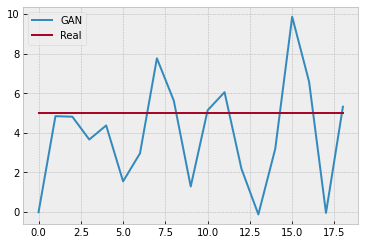

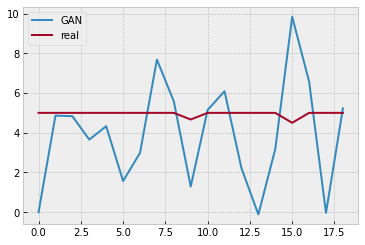

Batch_no: 87000  Epoch: 3107


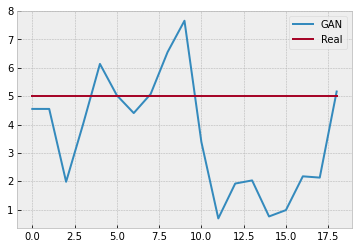

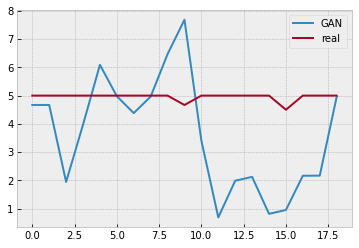

Batch_no: 87500  Epoch: 3125


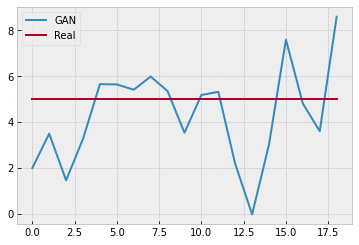

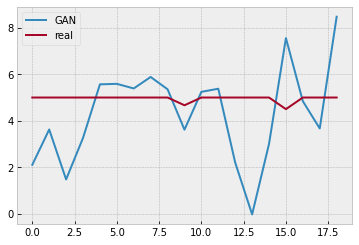

Batch_no: 88000  Epoch: 3142


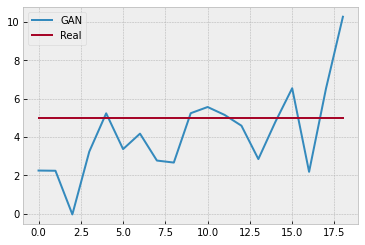

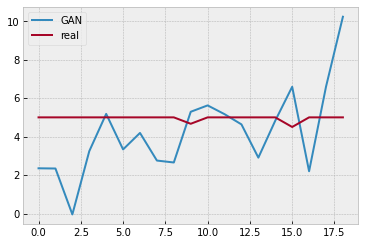

Batch_no: 88500  Epoch: 3160


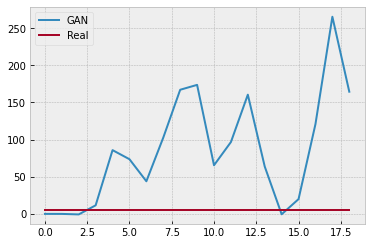

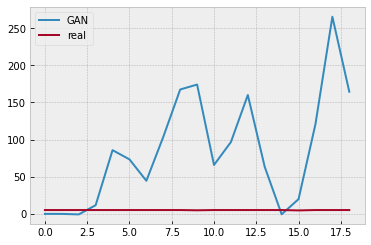

Batch_no: 89000  Epoch: 3178


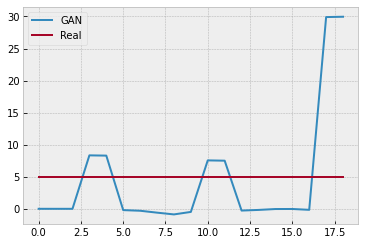

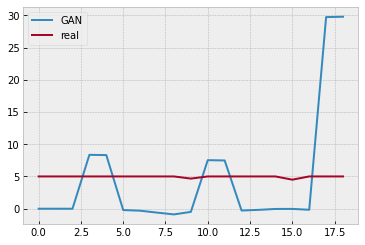

Batch_no: 89500  Epoch: 3196


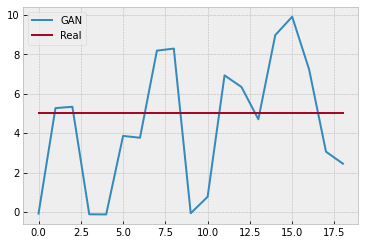

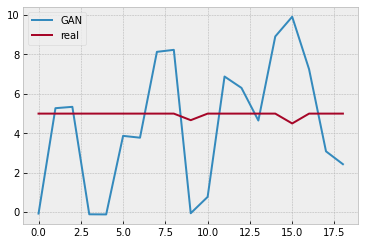

Batch_no: 90000  Epoch: 3214


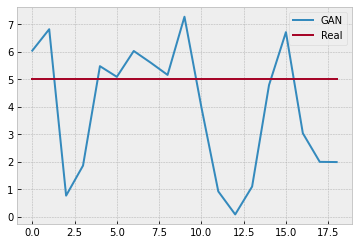

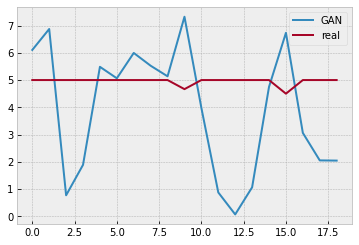

Batch_no: 90500  Epoch: 3232


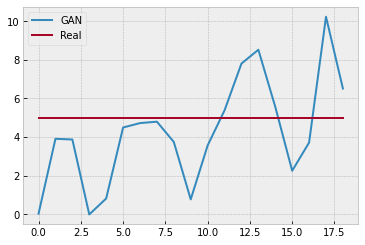

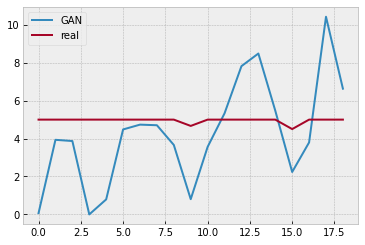

Batch_no: 91000  Epoch: 3250


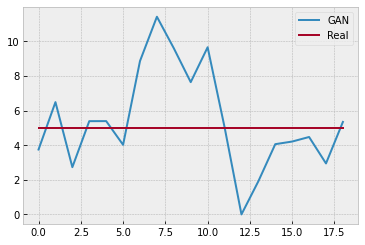

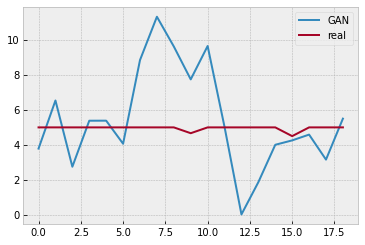

Batch_no: 91500  Epoch: 3267


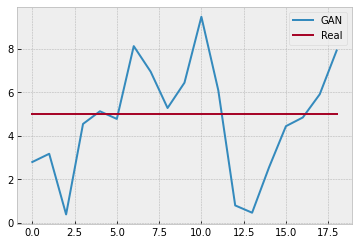

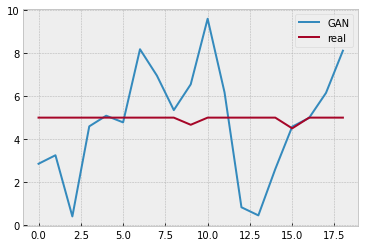

Batch_no: 92000  Epoch: 3285


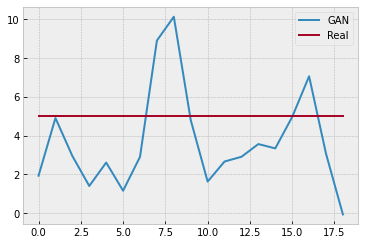

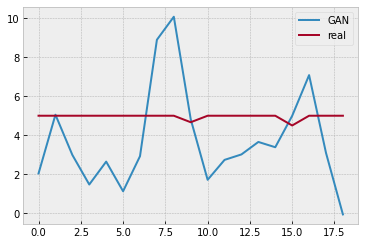

Batch_no: 92500  Epoch: 3303


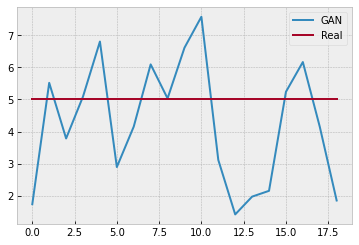

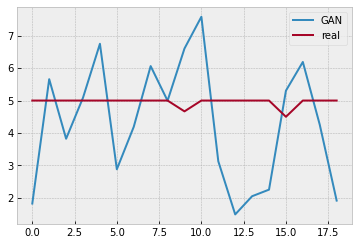

Batch_no: 93000  Epoch: 3321


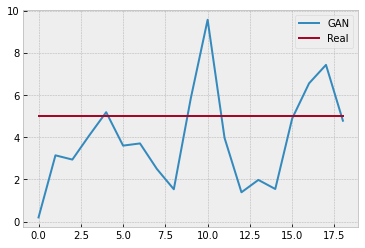

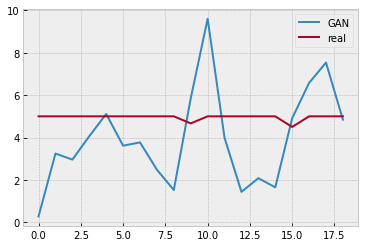

Batch_no: 93500  Epoch: 3339


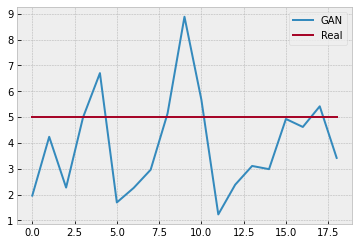

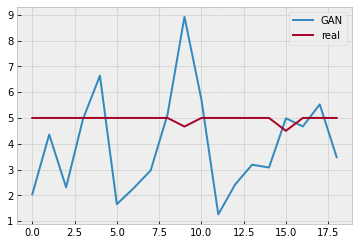

Batch_no: 94000  Epoch: 3357


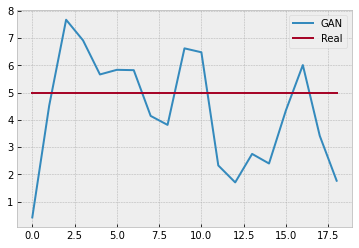

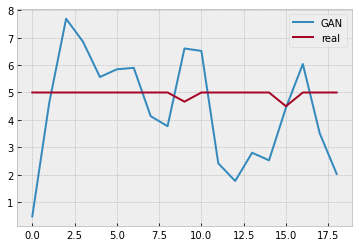

Batch_no: 94500  Epoch: 3375


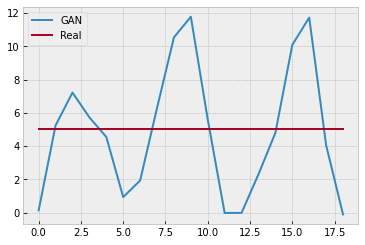

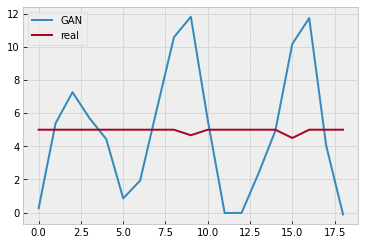

Batch_no: 95000  Epoch: 3392


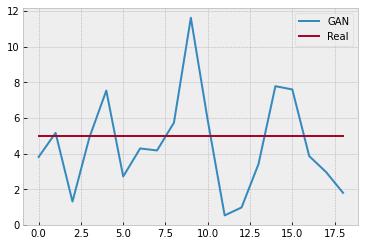

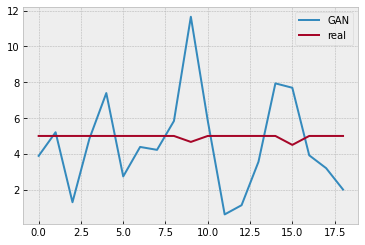

Batch_no: 95500  Epoch: 3410


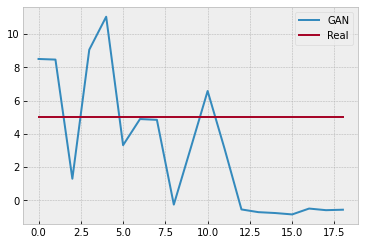

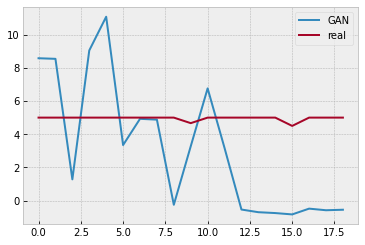

Batch_no: 96000  Epoch: 3428


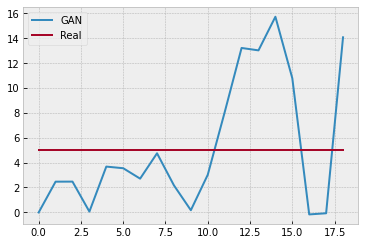

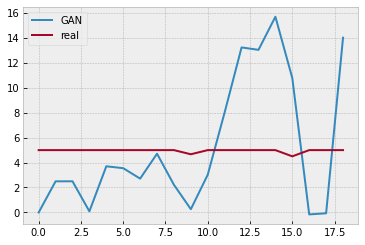

Batch_no: 96500  Epoch: 3446


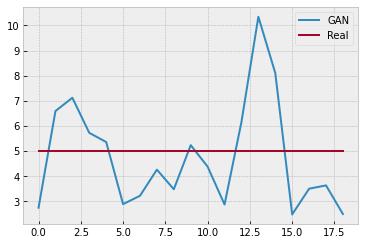

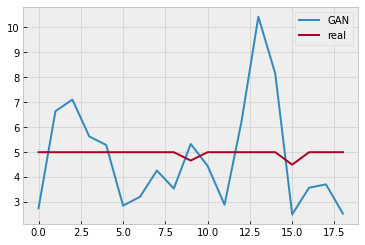

Batch_no: 97000  Epoch: 3464


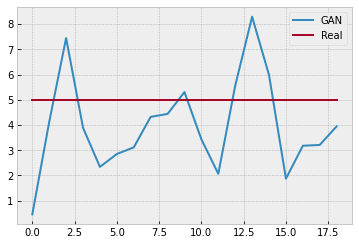

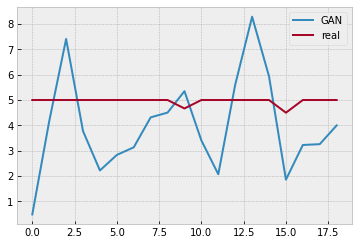

Batch_no: 97500  Epoch: 3482


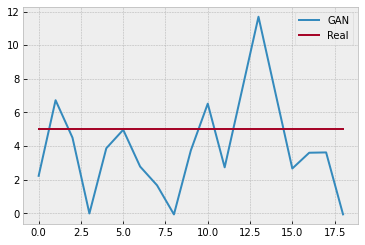

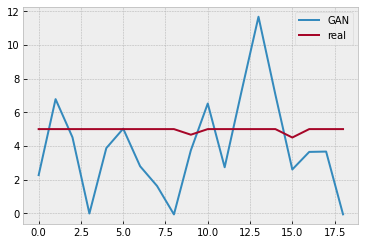

Batch_no: 98000  Epoch: 3500


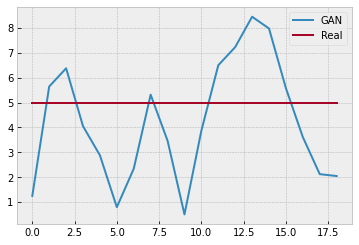

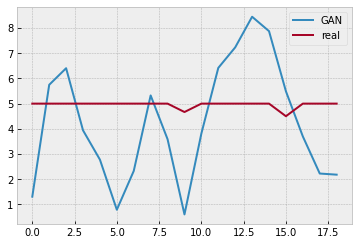

Batch_no: 98500  Epoch: 3517


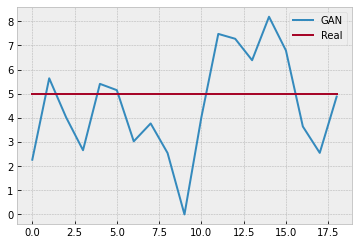

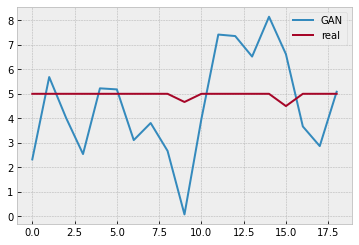

Batch_no: 99000  Epoch: 3535


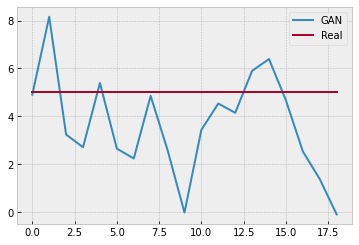

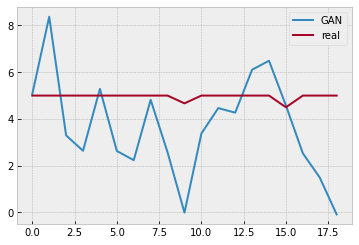

Batch_no: 99500  Epoch: 3553


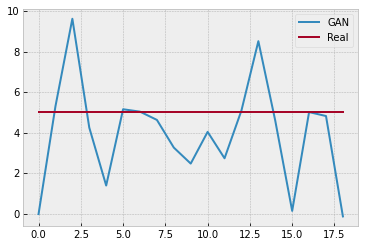

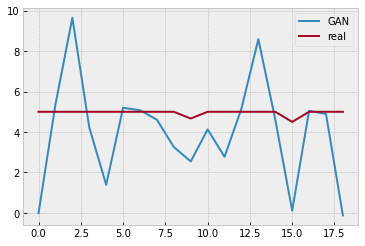

Batch_no: 100000  Epoch: 3571


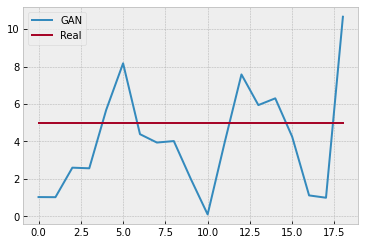

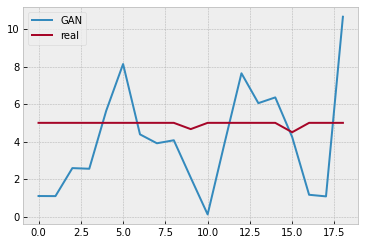

Batch_no: 100500  Epoch: 3589


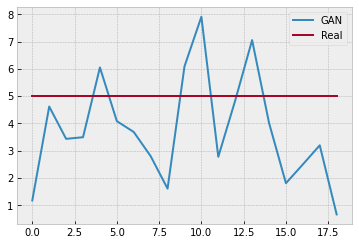

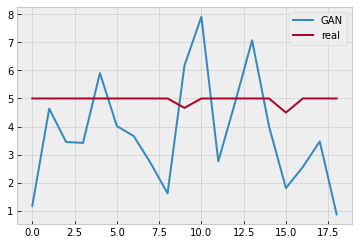

Batch_no: 101000  Epoch: 3607


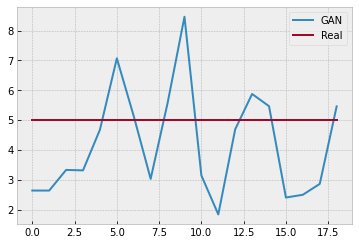

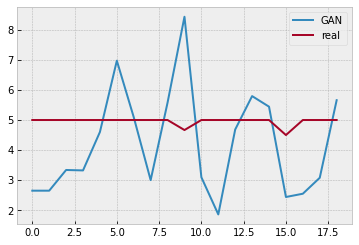

Batch_no: 101500  Epoch: 3625


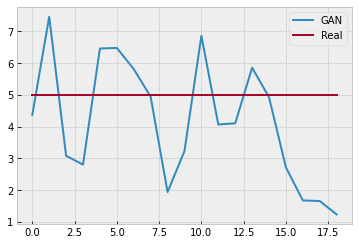

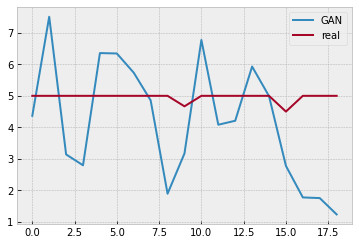

Batch_no: 102000  Epoch: 3642


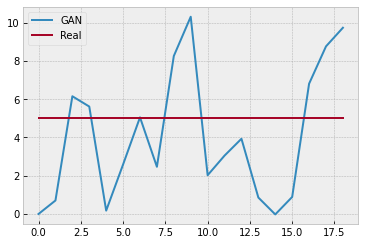

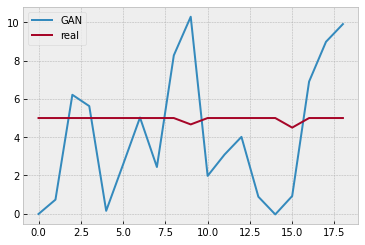

Batch_no: 102500  Epoch: 3660


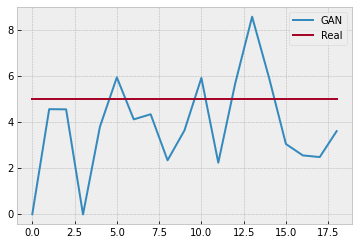

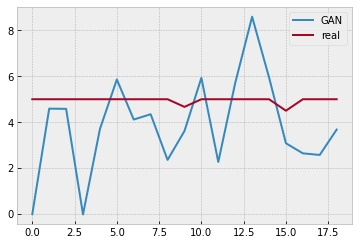

Batch_no: 103000  Epoch: 3678


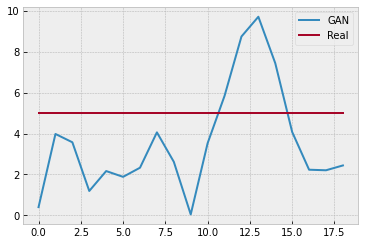

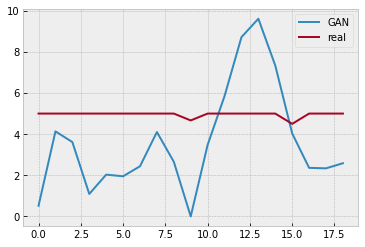

Batch_no: 103500  Epoch: 3696


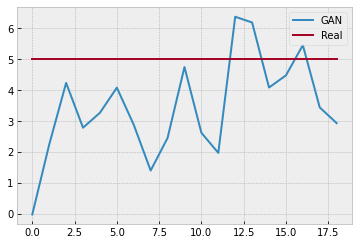

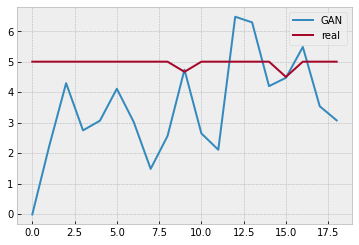

Batch_no: 104000  Epoch: 3714


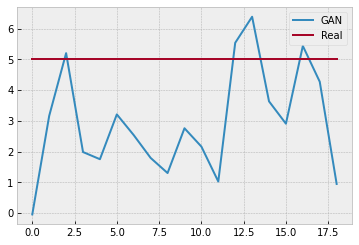

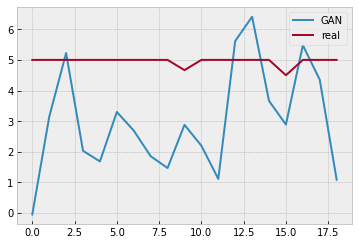

Batch_no: 104500  Epoch: 3732


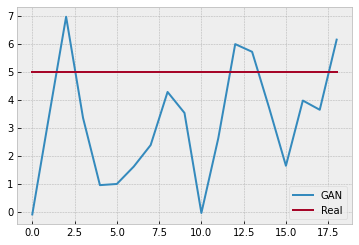

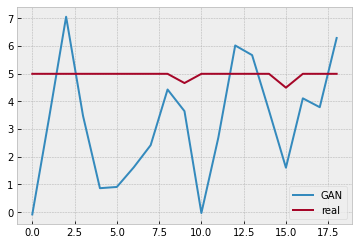

Batch_no: 105000  Epoch: 3750


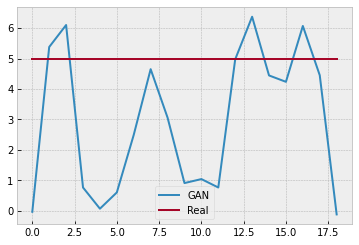

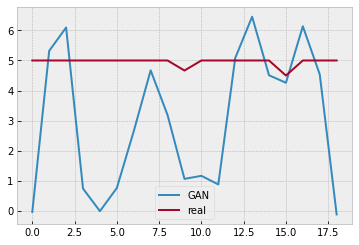

Batch_no: 105500  Epoch: 3767


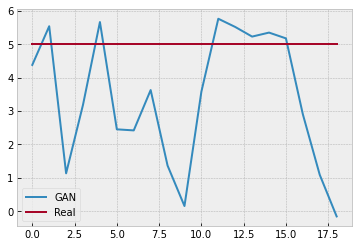

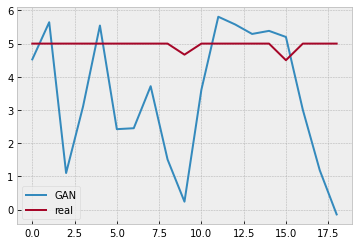

Batch_no: 106000  Epoch: 3785


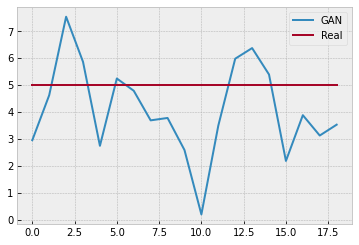

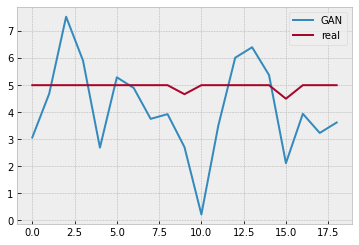

Batch_no: 106500  Epoch: 3803


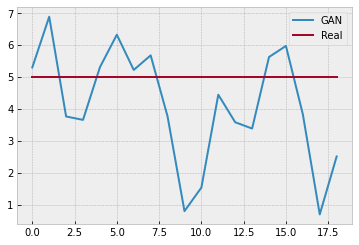

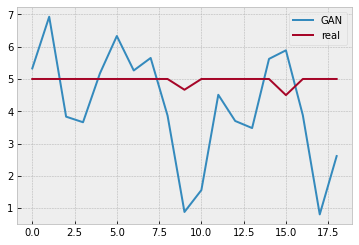

Batch_no: 107000  Epoch: 3821


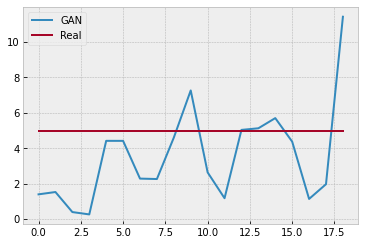

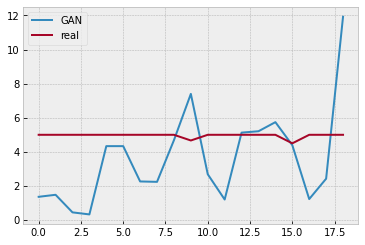

Batch_no: 107500  Epoch: 3839


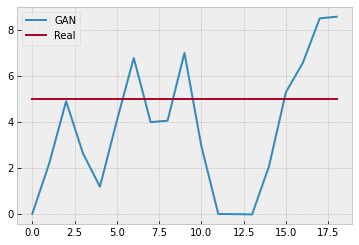

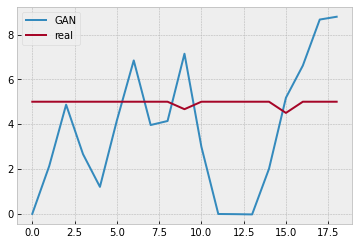

Batch_no: 108000  Epoch: 3857


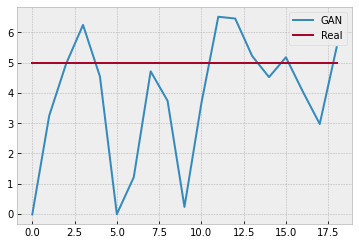

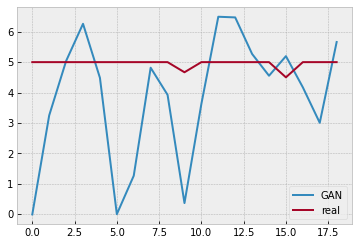

Batch_no: 108500  Epoch: 3875


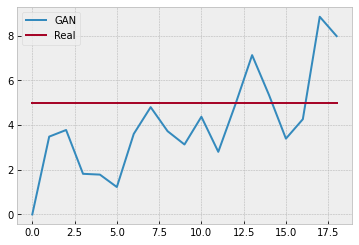

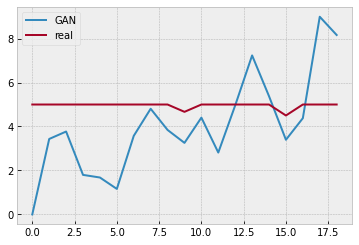

Batch_no: 109000  Epoch: 3892


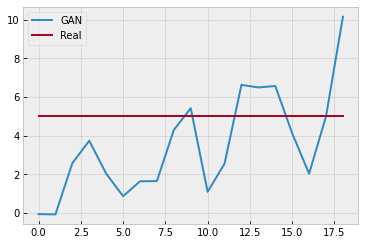

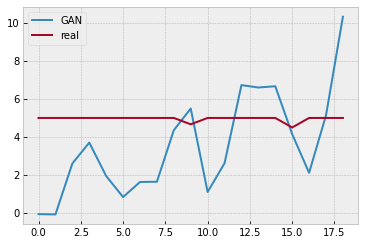

Batch_no: 109500  Epoch: 3910


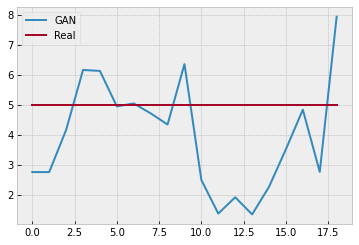

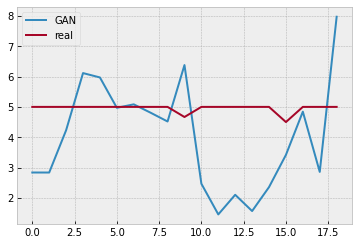

Batch_no: 110000  Epoch: 3928


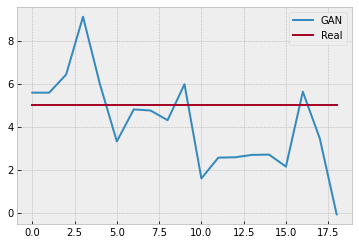

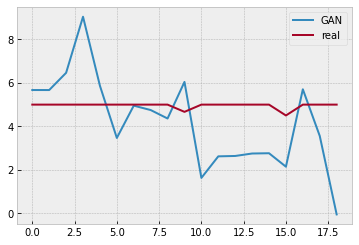

Batch_no: 110500  Epoch: 3946


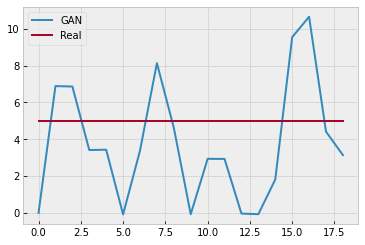

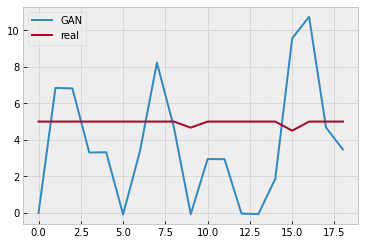

Batch_no: 111000  Epoch: 3964


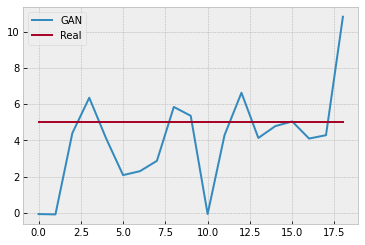

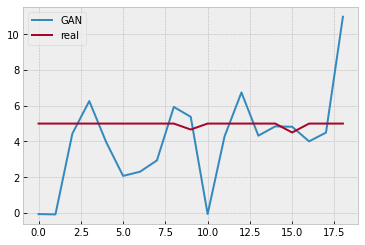

Batch_no: 111500  Epoch: 3982


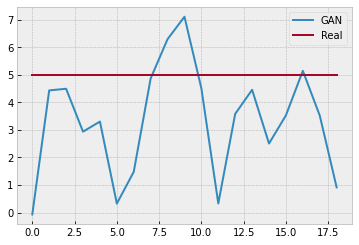

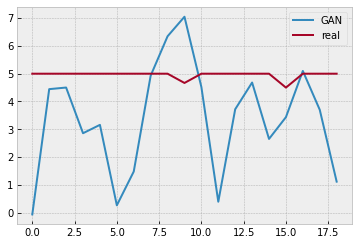

Batch_no: 112000  Epoch: 4000


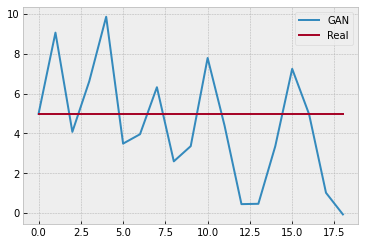

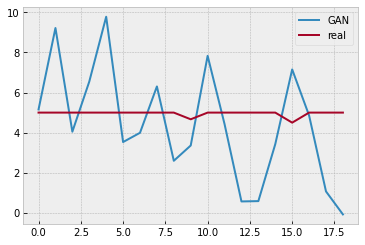

Batch_no: 112500  Epoch: 4017


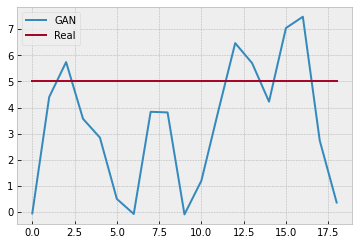

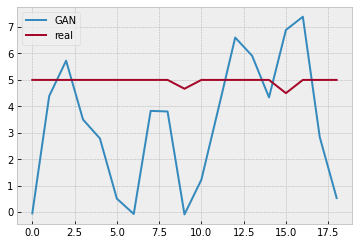

Batch_no: 113000  Epoch: 4035


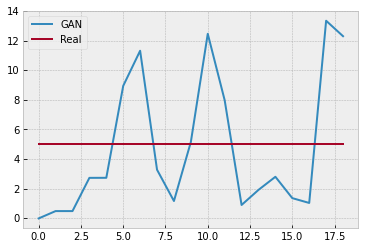

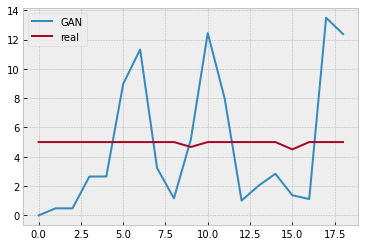

Batch_no: 113500  Epoch: 4053


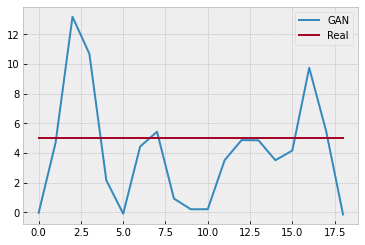

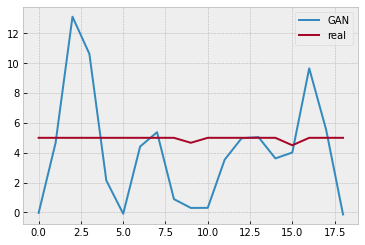

Batch_no: 114000  Epoch: 4071


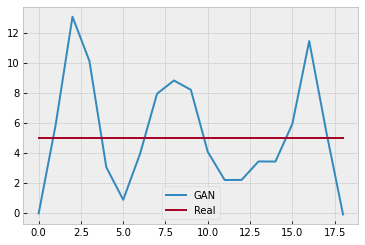

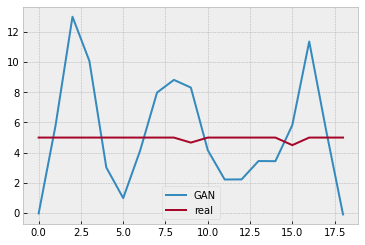

Batch_no: 114500  Epoch: 4089


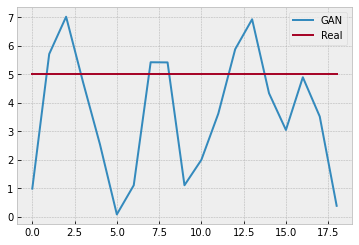

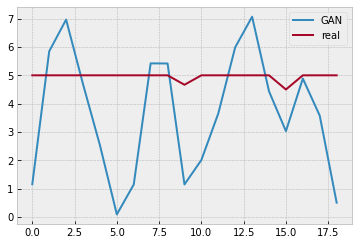

Batch_no: 115000  Epoch: 4107


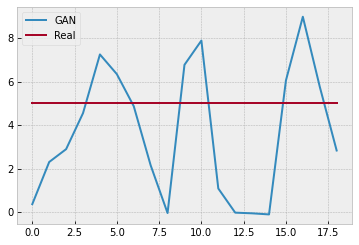

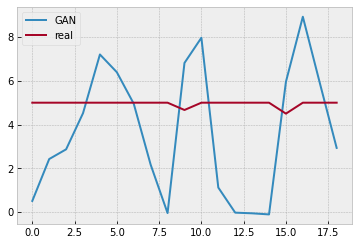

Batch_no: 115500  Epoch: 4125


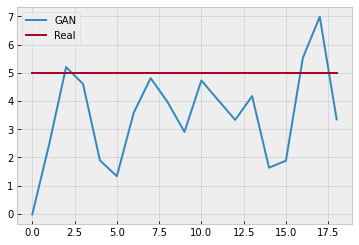

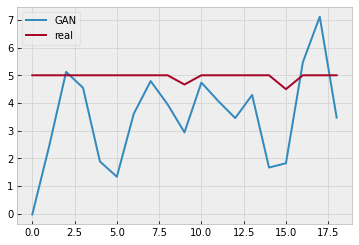

Batch_no: 116000  Epoch: 4142


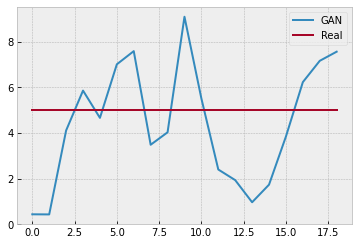

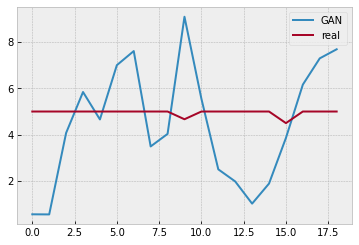

Batch_no: 116500  Epoch: 4160


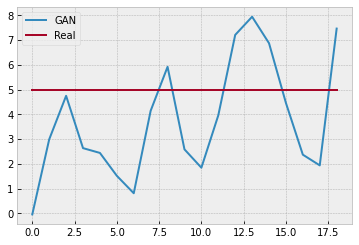

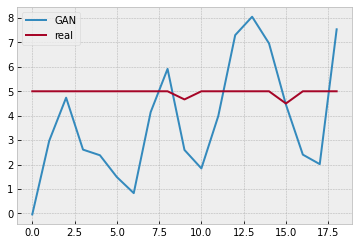

Batch_no: 117000  Epoch: 4178


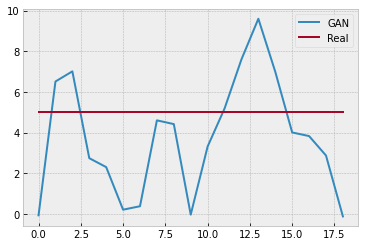

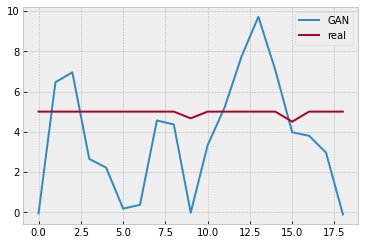

Batch_no: 117500  Epoch: 4196


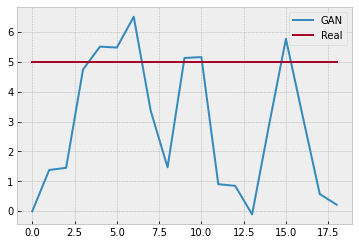

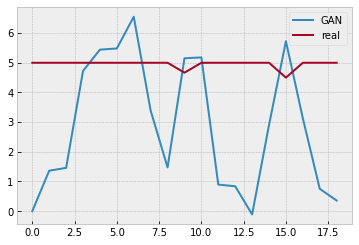

Batch_no: 118000  Epoch: 4214


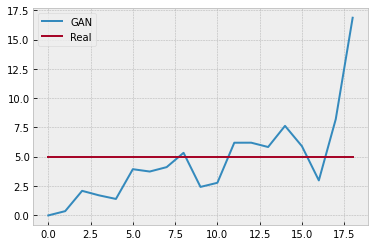

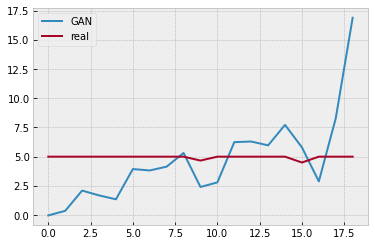

Batch_no: 118500  Epoch: 4232


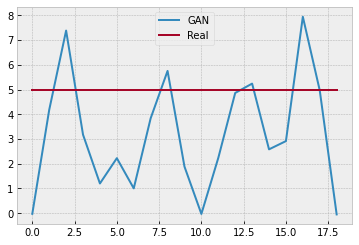

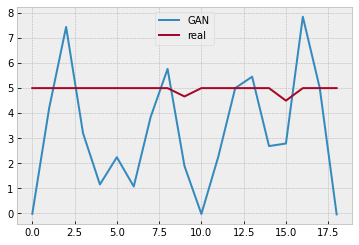

Batch_no: 119000  Epoch: 4250


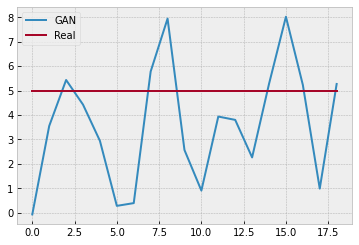

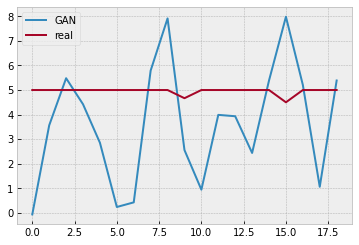

Batch_no: 119500  Epoch: 4267


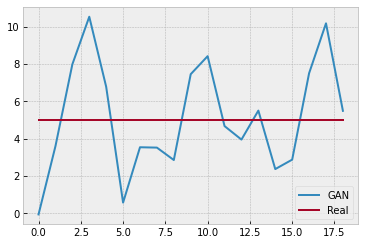

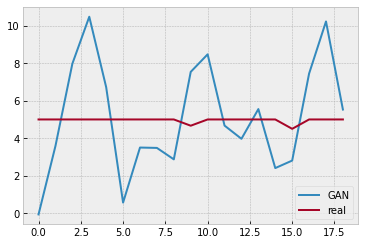

Batch_no: 120000  Epoch: 4285


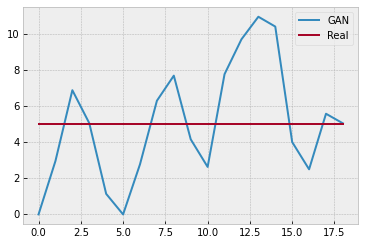

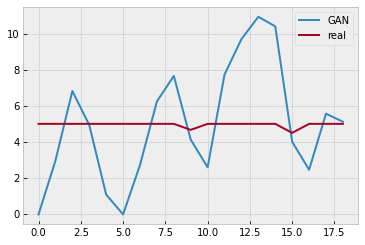

Batch_no: 120500  Epoch: 4303


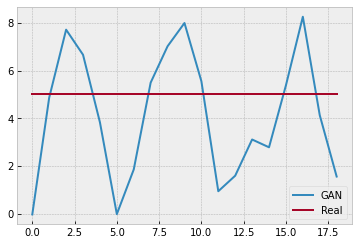

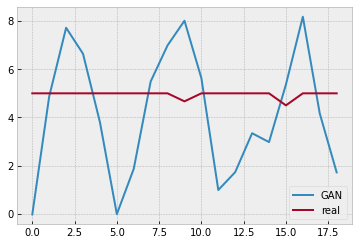

Batch_no: 121000  Epoch: 4321


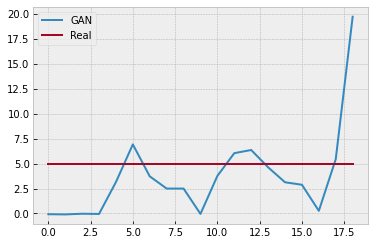

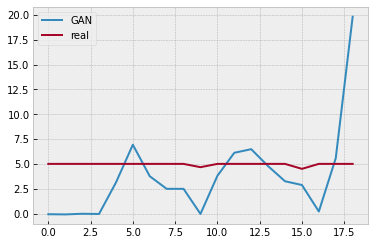

Batch_no: 121500  Epoch: 4339


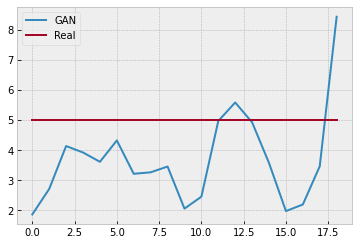

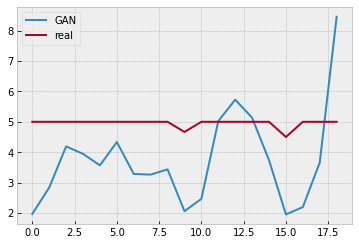

Batch_no: 122000  Epoch: 4357


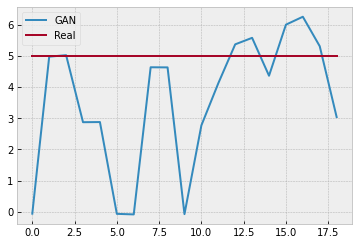

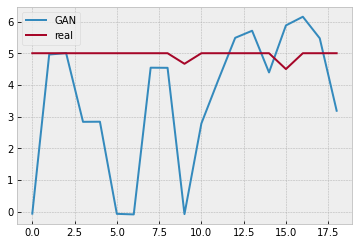

Batch_no: 122500  Epoch: 4375


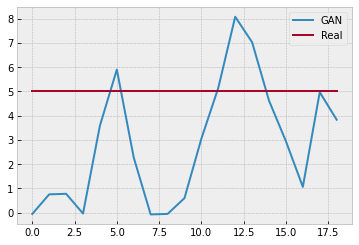

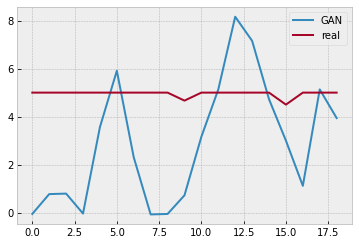

Batch_no: 123000  Epoch: 4392


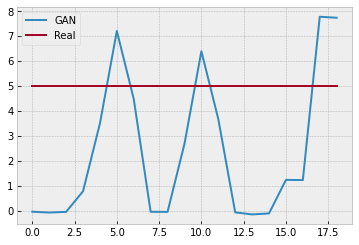

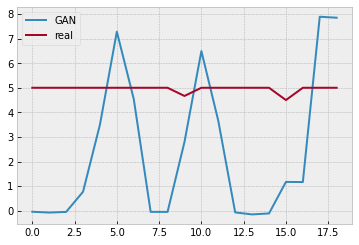

Batch_no: 123500  Epoch: 4410


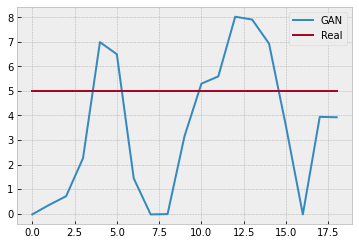

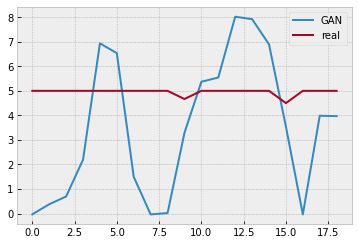

Batch_no: 124000  Epoch: 4428


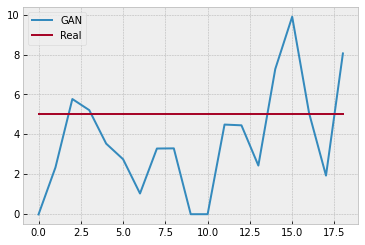

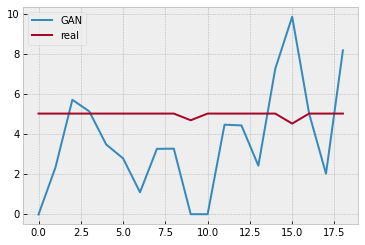

Batch_no: 124500  Epoch: 4446


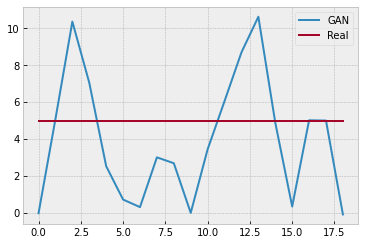

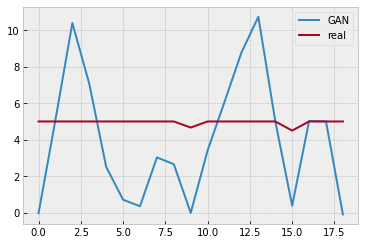

Batch_no: 125000  Epoch: 4464


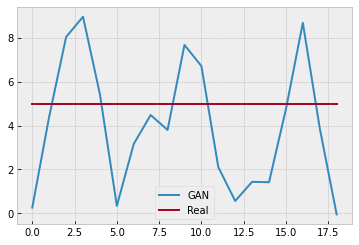

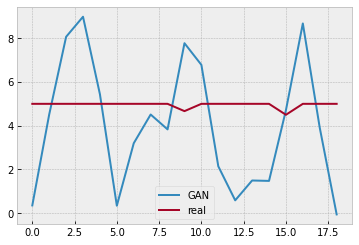

Batch_no: 125500  Epoch: 4482


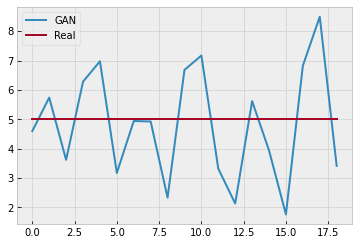

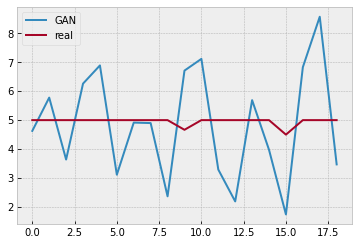

Batch_no: 126000  Epoch: 4500


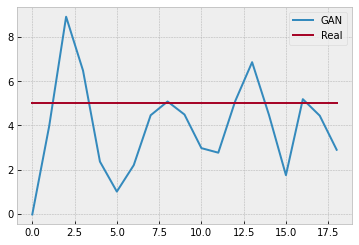

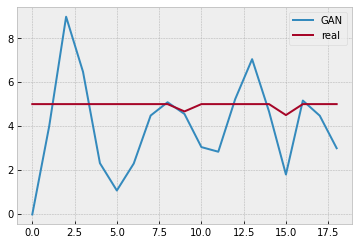

Batch_no: 126500  Epoch: 4517


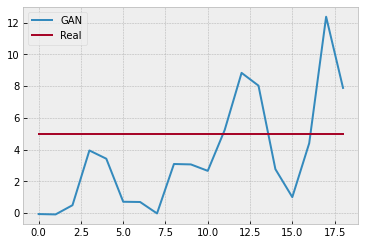

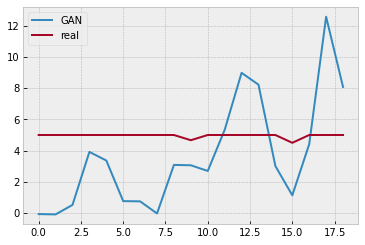

Batch_no: 127000  Epoch: 4535


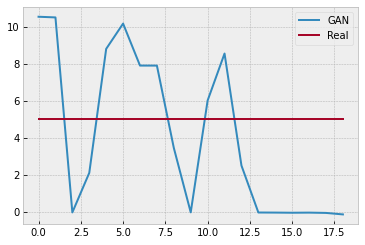

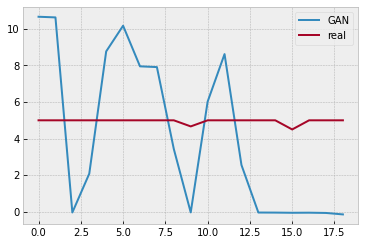

Batch_no: 127500  Epoch: 4553


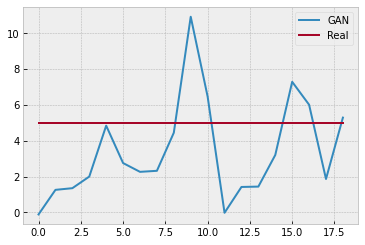

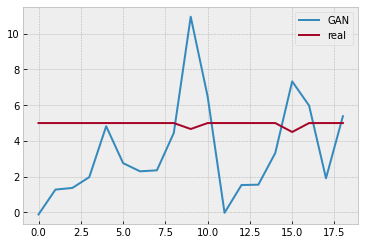

Batch_no: 128000  Epoch: 4571


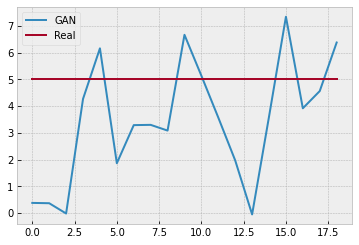

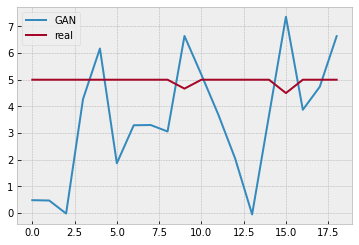

Batch_no: 128500  Epoch: 4589


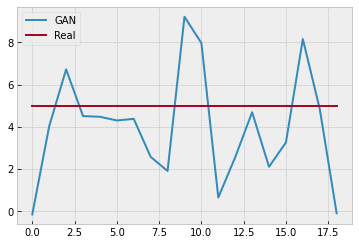

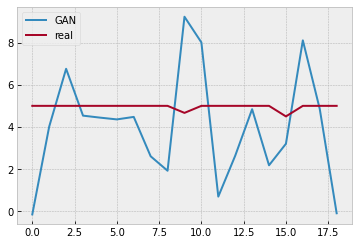

Batch_no: 129000  Epoch: 4607


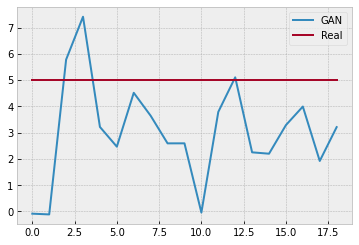

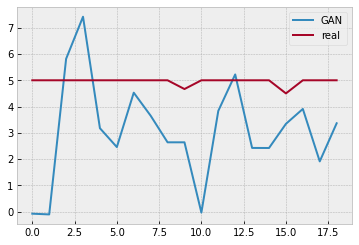

Batch_no: 129500  Epoch: 4625


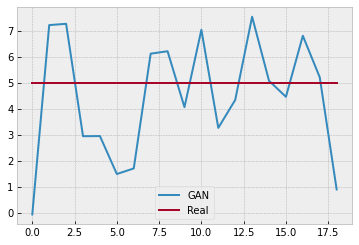

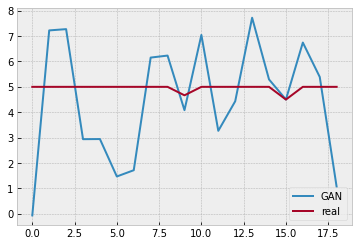

Batch_no: 130000  Epoch: 4642


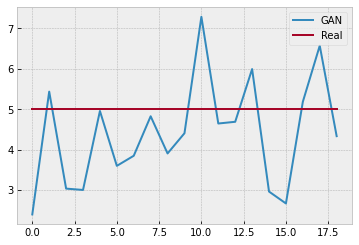

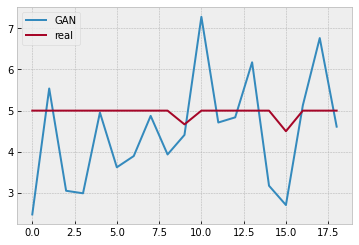

Batch_no: 130500  Epoch: 4660


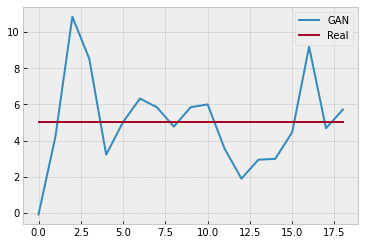

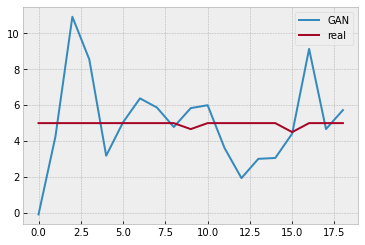

Batch_no: 131000  Epoch: 4678


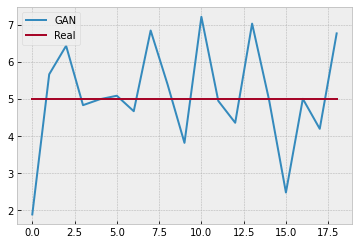

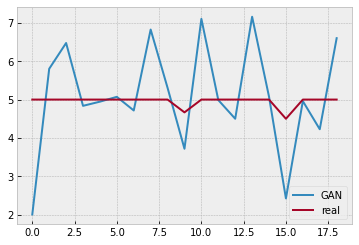

Batch_no: 131500  Epoch: 4696


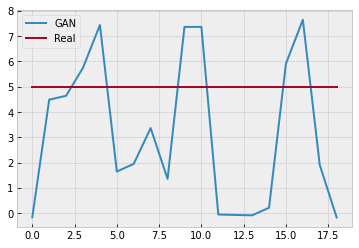

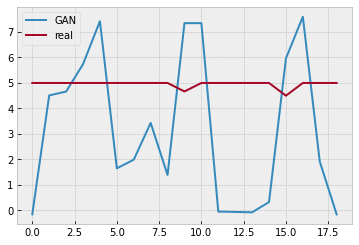

Batch_no: 132000  Epoch: 4714


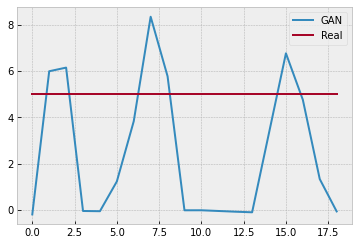

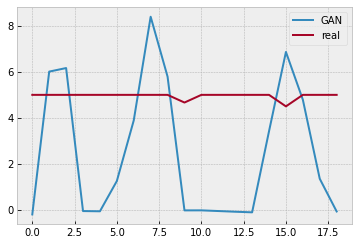

Batch_no: 132500  Epoch: 4732


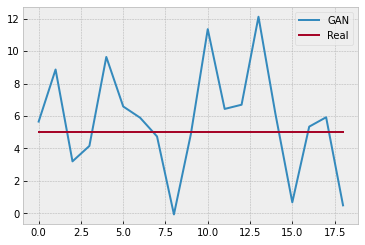

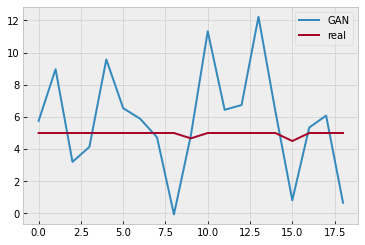

Batch_no: 133000  Epoch: 4750


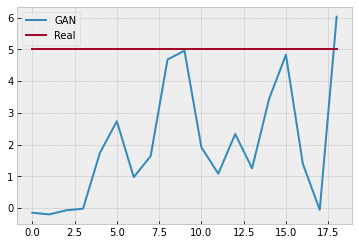

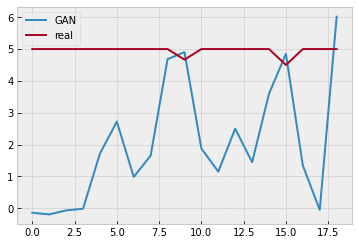

Batch_no: 133500  Epoch: 4767


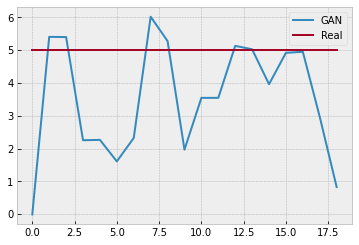

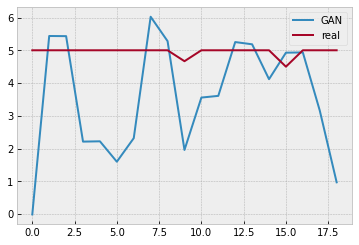

Batch_no: 134000  Epoch: 4785


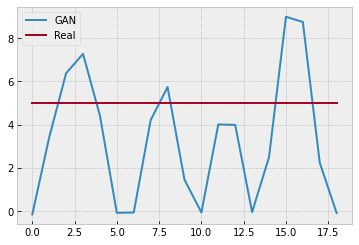

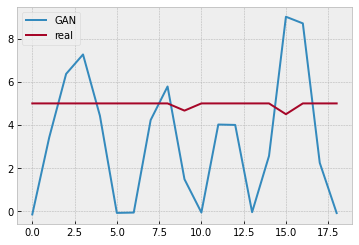

Batch_no: 134500  Epoch: 4803


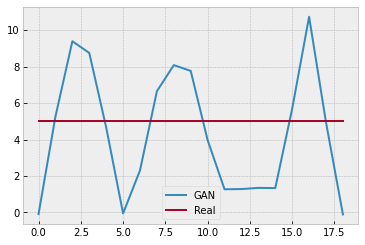

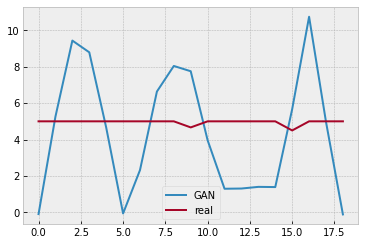

Batch_no: 135000  Epoch: 4821


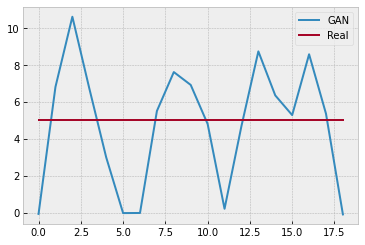

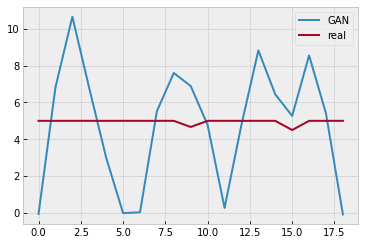

Batch_no: 135500  Epoch: 4839


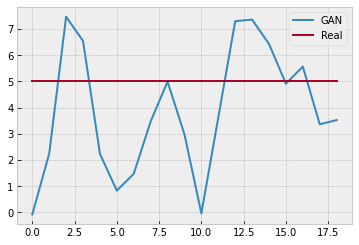

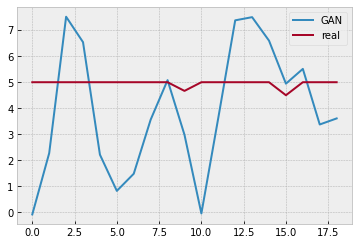

Batch_no: 136000  Epoch: 4857


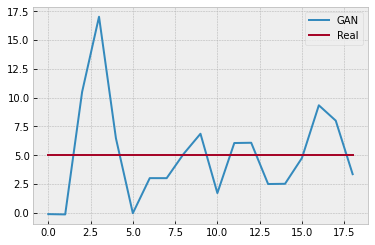

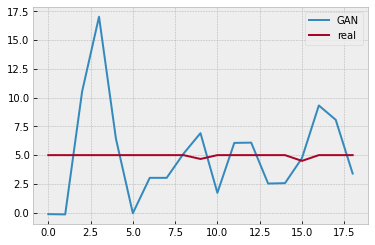

Batch_no: 136500  Epoch: 4875


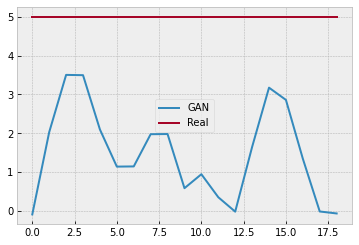

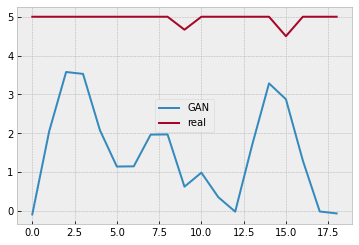

Batch_no: 137000  Epoch: 4892


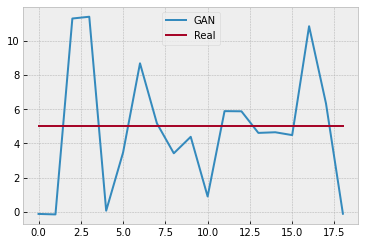

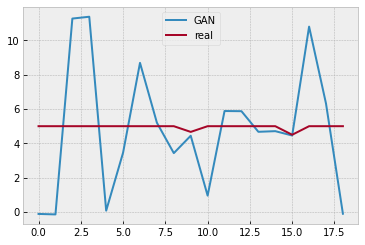

Batch_no: 137500  Epoch: 4910


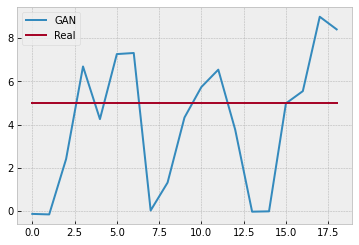

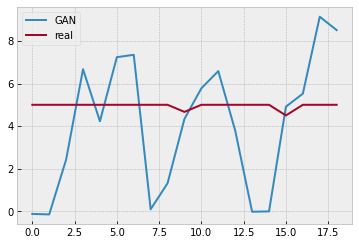

Batch_no: 138000  Epoch: 4928


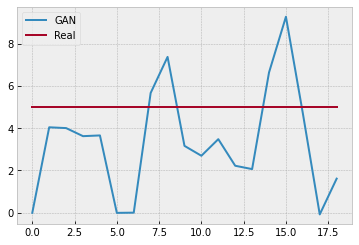

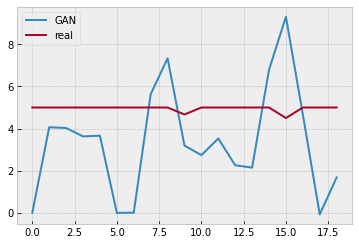

Batch_no: 138500  Epoch: 4946


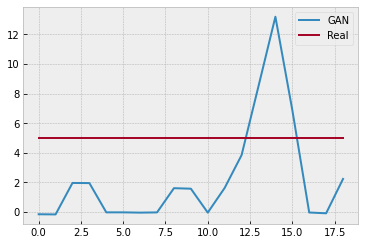

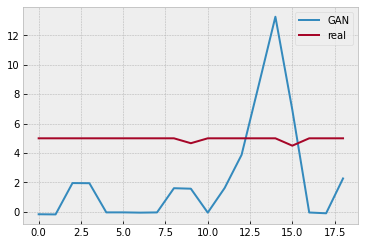

Batch_no: 139000  Epoch: 4964


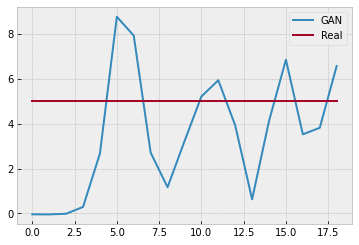

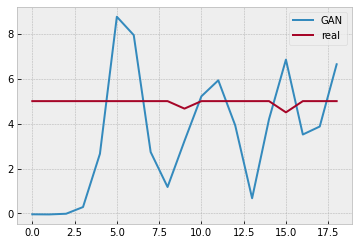

Batch_no: 139500  Epoch: 4982


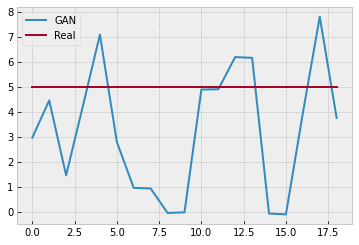

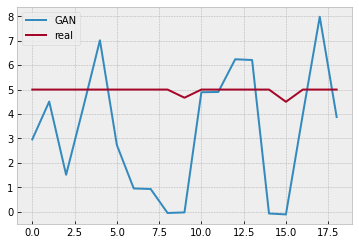

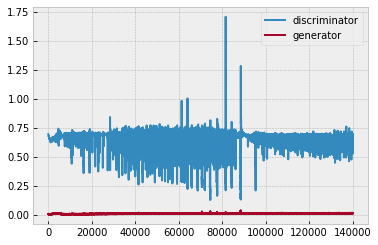

In [39]:


train_it=DataIterator()
dataloader=DataLoader(dataset=train_it,batch_size=batch_size,shuffle=True)



# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

g_losses=[]
d_losses=[]



for epoch in range(n_epochs):
    g_running_loss=0.0
    d_running_loss=0.0
    for i, (aggregate, appliance) in enumerate(dataloader):

        #reshaping to fit the convolution layer
        aggregate_reshaped=aggregate.reshape(aggregate.shape[0],1,aggregate.shape[1])

        batch_size = appliance.shape[0]
        app=appliance[:,:]

        # Adversarial ground truths
        valid = Variable(FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False)
        fake = Variable(FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_aggregate_reshaped = Variable(aggregate_reshaped.type(FloatTensor))
        real_appliance = Variable(app.type(FloatTensor))
        real_aggregate= Variable(aggregate.type(FloatTensor))

        real_app_real_agg=torch.cat((real_appliance,real_aggregate),1)


        # -----------------
        #  Train Generator
        # -----------------
        optimizer_G.zero_grad()


        gen_appliance = generator(real_aggregate_reshaped)




        gen_app_real_agg=torch.cat((gen_appliance,real_aggregate),1)

        validity,feat= discriminator(gen_app_real_agg)

        g_loss=feature_loss(feat, real_app_real_agg)
#         g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        optimizer_G.step()
        g_loss_1=g_loss.item()



########################################################################################################################
# # Generator second training round


        optimizer_G.zero_grad()

        gen_appliance = generator(real_aggregate_reshaped)



#         gen_appliance=gen_appliance-first_gen #subtract




        gen_app_real_agg=torch.cat((gen_appliance,real_aggregate),1)
        validity,feat = discriminator(gen_app_real_agg)
        g_loss = feature_loss(feat, real_app_real_agg)



        g_loss.backward()
        g_loss_2=g_loss.item()

        optimizer_G.step()


        optimizer_G.zero_grad()

        gen_appliance = generator(real_aggregate_reshaped)



        gen_app_real_agg=torch.cat((gen_appliance,real_aggregate),1)

        validity,feat = discriminator(gen_app_real_agg)


        g_loss = feature_loss(feat, real_app_real_agg)

        g_loss.backward()
        optimizer_G.step()

        g_loss_3=g_loss.item()

        g_losses.append((g_loss_1+g_loss_2+g_loss_3)/3)


# ----------
#  Training
# ----------


        # ---------------------
        #  Train Discriminator
        # ---------------------


        optimizer_D.zero_grad()


        real_app_real_agg=torch.cat((appliance,aggregate),1)

        real_app_real_agg=Variable(real_app_real_agg.type(FloatTensor))

        validity_real,_ = discriminator(real_app_real_agg)
        d_real_loss = adversarial_loss(validity_real, valid)

        validity_fake,_ = discriminator(gen_app_real_agg.detach()) #detach
        d_fake_loss = adversarial_loss(validity_fake, fake)

        d_loss = (d_real_loss + d_fake_loss) / 2


        d_loss.backward()
        optimizer_D.step()


        d_losses.append(d_loss.item())

        ## end trining discrimnator

        batches_done = epoch * len(dataloader) + i
        #print("Epoch:",epoch,"Batch:",i,"of:",len(dataloader),"batches done:",batches_done)
        if batches_done % sample_interval == 0:
            print("Batch_no:",batches_done," Epoch:",epoch)
            sample_data(n_row=1, batches_done=batches_done)
plt.plot(d_losses,label="discriminator")
plt.plot(g_losses,label="generator")
plt.legend()
plt.show()



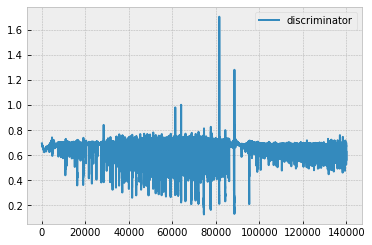

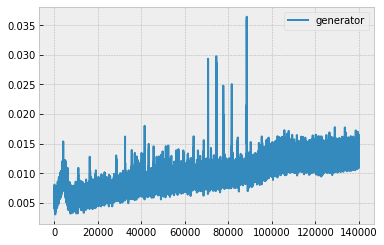

In [40]:

# plt.figure(figsize=(18.5,10.5))
plt.plot(d_losses,label="discriminator")
plt.legend()
plt.show()

plt.plot(g_losses,label="generator")
plt.legend()
plt.show()


In [41]:
torch.save(generator,'C:/Users/chang/PycharmProjects/GAN/GAN-NILM/GAN_models/REDD/microwave_gen_gan.pk1')
torch.save(discriminator,'C:/Users/chang/PycharmProjects/GAN/GAN-NILM/GAN_models/REDD/microwave_dis_gan.pk1')

## Disaggregate

In [12]:
generator = torch.load('C:/Users/chang/PycharmProjects/GAN/GAN-NILM/GAN_models/REDD/microwave_gen_gan.pk1')
discriminator = torch.load('C:/Users/chang/PycharmProjects/GAN/GAN-NILM/GAN_models/REDD/microwave_dis_gan.pk1')

In [14]:
def get_mae(target, prediction):
    assert (target.shape == prediction.shape)

    return mean_absolute_error(target, prediction)

def get_sae(target, prediction):
    assert (target.shape == prediction.shape)

    r = target.sum()
    r0 = prediction.sum()
    sae = abs(r0 - r) / r
    print("targe sum is :", r)
    print("prediction sum is:", r0)
    return sae

def get_nde(target, prediction):
    assert (target.shape == prediction.shape)

    error, squarey = [], []
    for i in range(len(prediction)):
        value = prediction[i] - target[i]
        error.append(value * value)
        squarey.append(target[i] * target[i])
    nde = sqrt(sum(error) / sum(squarey))
    return nde

In [18]:
from math import sqrt
from sklearn.model_selection import train_test_split
def model_test_mae(X_test,Y_test):
    w=sig_len
    step=int(15)
    agg_segments=X_test   
    app_segments=Y_test    

    scale_agg_test.fit(agg_segments)
    scale_app_test.fit(app_segments)


    agg_segments_scaled=scale_agg_test.transform(agg_segments)
    agg_segments_scaled_reshaped=agg_segments_scaled.reshape(agg_segments_scaled.shape[0],1,agg_segments_scaled.shape[1])
    app_segments_scaled=scale_app_test.transform(app_segments)


    samples_from=0
    samples_to=int(len(agg_segments_scaled_reshaped))

    sub_agg_segments=agg_segments_scaled_reshaped[samples_from:samples_to,:]
    sub_app_true=app_segments_scaled[samples_from:samples_to,:]

    #sub_app_true=app_segments[samples_from:samples_to,:]
    gen_out=disaggregate(sub_agg_segments)#tensor generated

    disaggregated_appliance=np.array(gen_out.cpu().detach()) #numpy appliance generated
    disaggregated_appliance_inv=scale_app_test.inverse_transform(disaggregated_appliance)

    # sub_app_true_inv=scale_app.inverse_transform(sub_app_true) #app segments

#     threshold=0
#     disaggregated_appliance_inv[disaggregated_appliance_inv<=threshold] = 0
#     sub_agg_segments[sub_agg_segments<=threshold] = 0


    disaggregation_confidence=confidence(appliance=gen_out,aggregate=sub_agg_segments[:,0,:])
    disaggregation_confidence.shape


    indecis_matrix=np.zeros(sub_app_true.shape)
    indecis_matrix.shape

    d=np.array(disaggregation_confidence.cpu().detach())
    confidence_repeated=np.repeat(d,disaggregated_appliance.shape[1],axis=1)


    k=0
    for i in range(len(indecis_matrix)):
        indecis_matrix[i,:]=np.arange(k,k+w,dtype = 'int')
        k+=step
    indecis_matrix=indecis_matrix.reshape(1,-1).astype("int")
    disaggregated_appliance_flat=disaggregated_appliance_inv.reshape(1,-1)
    real_appliance_flat=app_segments.reshape(1,-1)
    confidence_repeated_flat=confidence_repeated.reshape(1,-1)


    print("segmenting predictions...")

    pred_dict={}
    confidence_dict={}
    real_dict={}

    for j in range(np.max(indecis_matrix)):
        if j % 5000 == 0:
            print(j," of ", np.max(indecis_matrix))
        a=np.where(indecis_matrix==j)[1]
        pred_dict[j]=disaggregated_appliance_flat[0,a]
        confidence_dict[j]=confidence_repeated_flat[0,a]
        real_dict[j]=real_appliance_flat[0,a]

    from scipy import stats
    threshold=0

    pred_clustered=[] 
    true_app_list=[]
    for key in pred_dict.keys():
        p=pred_dict[key]
        conf=confidence_dict[key]
    #     p[p<=threshold]=0  # thresholding
    #     pred_clustered.append(p.mean())

        pred_clustered.append(p[np.argmax(conf)])
    #     pred_clustered.append(np.percentile(pred_dict[key],80))
        tr=real_dict[key]
    #     tr[tr<=threshold]=0

        true_app_list.append(tr[0])
#     from sklearn.metrics import mean_squared_error, zero_one_loss,mean_absolute_error,r2_score  
    pred_clustered=np.array(pred_clustered)
    true_app_list=np.array(true_app_list)
    pts=10

    pred_clustered_train,pred_clustered,true_app_list_train,true_app_list=train_test_split(pred_clustered, true_app_list, test_size=0.2, random_state=100)
    pred_clustered=smooth(pred_clustered,box_pts=pts)
    true_app_list=smooth(true_app_list,box_pts=pts)
    print("all len")
    
    mae=get_mae(true_app_list,pred_clustered)
    sae=get_sae(true_app_list,pred_clustered)
    nde=get_nde(true_app_list,pred_clustered)
    
    return mae, sae, nde,pred_clustered,true_app_list
mae,sae,nde,pred_clustered, true_app_list=model_test_mae(X,Y)
print(mae)
print(sae)
print(nde)

segmenting predictions...
0  of  530748
5000  of  530748
10000  of  530748
15000  of  530748
20000  of  530748
25000  of  530748
30000  of  530748
35000  of  530748
40000  of  530748
45000  of  530748
50000  of  530748
55000  of  530748
60000  of  530748
65000  of  530748
70000  of  530748
75000  of  530748
80000  of  530748
85000  of  530748
90000  of  530748
95000  of  530748
100000  of  530748
105000  of  530748
110000  of  530748
115000  of  530748
120000  of  530748
125000  of  530748
130000  of  530748
135000  of  530748
140000  of  530748
145000  of  530748
150000  of  530748
155000  of  530748
160000  of  530748
165000  of  530748
170000  of  530748
175000  of  530748
180000  of  530748
185000  of  530748
190000  of  530748
195000  of  530748
200000  of  530748
205000  of  530748
210000  of  530748
215000  of  530748
220000  of  530748
225000  of  530748
230000  of  530748
235000  of  530748
240000  of  530748
245000  of  530748
250000  of  530748
255000  of  530748
260000  of 

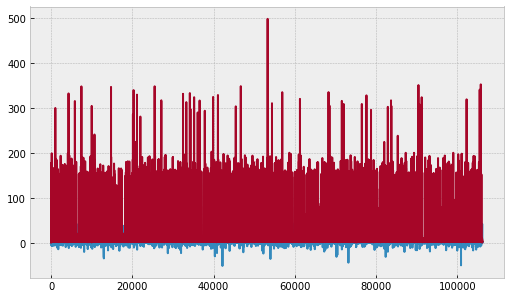

NameError: name 'predictions_smoothed' is not defined

<Figure size 612x360 with 0 Axes>

In [19]:
# fig = plt.figure(figsize=(8.5,5.0))

# plt.plot(pred_clustered)
# # plt.show()
# plt.plot(true_app_list)
# plt.show()
# fig = plt.figure(figsize=(8.5,5.0))

# plt.plot(predictions_smoothed)
# # plt.show()
# plt.plot(appliance_true_smoothed)

# plt.show()

In [44]:
# from sklearn.metrics import mean_squared_error, zero_one_loss,mean_absolute_error,r2_score  
# pred_clustered=np.array(pred_clustered)
# true_app_list=np.array(true_app_list)

# mean_absolute_error(pred_clustered, true_app_list)


# # pts=10
# # predictions_smoothed=smooth(predictions,box_pts=pts)
# # appliance_true_smoothed=smooth(appliance_true,box_pts=pts)#(appliance_true[:,0],box_pts=10)

# # f1=[]
# # mae=[]
# # for i in range(0,1000,10):
# # #     print(i)
# #     _,_,f,_=classification_metrics(predictions_smoothed,appliance_true_smoothed,thresh=i)
# #     f1.append(f)
# #     _,mae1=energy_metrics(predictions_smoothed,appliance_true_smoothed,thresh=i)
# #     mae.append(mae1)


# # print("+++++++++++++++++++")
# # # print(str(g_retrain))
# # print("Smoothed..")
# # # predictions_smoothed[predictions_smoothed<1250]=0
# # recall2,precision2,F12,accuracy2=classification_metrics(predictions_smoothed,appliance_true_smoothed,thresh=10)
# # print("recall= %f, precision= %f, F1= %f, accuracy= %f" %(recall2,precision2,F12,accuracy2))

# # RE2,MAE2=energy_metrics(predictions_smoothed,appliance_true_smoothed,thresh=10)
# # print("RE=%f, MAE= %f"%(RE2,MAE2))
# # # performance1[str(g_retrain)]=[F12,MAE2,RE2]

# # print("=============================================================")


# # print(max(f1),min(mae))
# # plt.plot(f1)
# # plt.show()

# # plt.plot(mae)
# # plt.show()

In [45]:
# fig = plt.figure(figsize=(8.5,5.0))

# plt.plot(predictions_smoothed[6900:7100])
# # plt.show()
# plt.plot(appliance_true_smoothed[6900:7100])
# plt.show()
# fig = plt.figure(figsize=(8.5,5.0))

# plt.plot(predictions_smoothed)
# # plt.show()
# plt.plot(appliance_true_smoothed)

# plt.show()

In [46]:


#     shift=0    
#     pred_clustered_shifted=np.zeros(len(pred_clustered))
#     pred_clustered_shifted[shift:len(pred_clustered)]=pred_clustered[0:len(pred_clustered)-shift]
#     # pred_clustered_shifted=pred_clustered_shifted-np.ones(pred_clustered_shifted.shape)*500
#     # pred_clustered_shifted[pred_clustered_shifted <=0] = 0


#     predictions=np.asarray(pred_clustered_shifted)[0:int(len(pred_clustered_shifted))]
#     appliance_true=np.asarray(Y_true[0:int(len(pred_clustered_shifted))])


#     predictions_smoothed=smooth(predictions,box_pts=10)
#     appliance_true_smoothed=smooth(appliance_true[:,0],box_pts=10)

#     print("+++++++++++++++++++")
#     print(str(g_retrain))
#     print("Smoothed..")
#     recall2,precision2,F12,accuracy2=classification_metrics(predictions_smoothed,appliance_true_smoothed,thresh=50)
#     print("recall= %f, precision= %f, F1= %f, accuracy= %f" %(recall2,precision2,F12,accuracy2))

#     RE2,MAE2=energy_metrics(predictions_smoothed,appliance_true_smoothed,thresh=50)
#     print("RE=%f, MAE= %f"%(RE2,MAE2))

#     performance1[str(g_retrain)]=[F12,MAE2,RE2]

#     print("=============================================================")


#     with open('perf_On_UKDALE_WM_data_amount.txt', 'a') as f:
#         f.write(str(g_retrain))
#         f.write(str(d_retrain))
#         f.write(portion)
#         f.write("   F1:")
#         f.write(str([F12]))
#         f.write("\n\n")
#     f.close()
#     portion=int(portion+15*35)



In [1]:
import numpy as np
import pandas as pd
import lightgbm as lgb
from hyperopt import fmin, tpe, hp, partial, Trials, STATUS_OK,STATUS_FAIL
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, zero_one_loss,mean_absolute_error,r2_score
import matplotlib.pyplot as plt
import time
from math import sqrt
import os
from tensorflow import keras
from keras_layer_normalization import LayerNormalization
# from loss import LossHistory
import math
import tensorflow.compat.v1 as tf
def dataProvider(train1, train2, train3,windowsize):
    offset = int(0.5 * (windowsize - 1.0))
    data_frame1 = pd.read_csv(train1,
                             #chunksize=10 ** 3,
                             header=0
                             )
    data_frame2 = pd.read_csv(train2,
                             #chunksize=10 ** 3,
                             header=0
                             )
    data_frame3 = pd.read_csv(train3,
                             #chunksize=10 ** 3,
                             header=0
                             )

    np_array = np.array(data_frame1)
    inputs, targets = np_array[:, 0], np_array[:, 1]
    window_num=inputs.size - 2 * offset
    features=list()
    labels=list()
    for i in range(0,window_num):
        inp=inputs[i:i+windowsize]
        tar=targets[i+offset]
        features.append(inp)
        labels.append(tar)
    features0=np.array(features)
    labels0=np.array(labels)

    np_array = np.array(data_frame2)
    inputs, targets = np_array[:, 0], np_array[:, 1]
    window_num=inputs.size - 2 * offset
    features=list()
    labels=list()
    for i in range(0,window_num):
        inp=inputs[i:i+windowsize]
        tar=targets[i+offset]
        features.append(inp)
        labels.append(tar)
    features1=np.array(features)
    labels1=np.array(labels)

    np_array = np.array(data_frame3)
    inputs, targets = np_array[:, 0], np_array[:, 1]
    window_num=inputs.size - 2 * offset
    features=list()
    labels=list()
    for i in range(0,window_num):
        inp=inputs[i:i+windowsize]
        tar=targets[i+offset]
        features.append(inp)
        labels.append(tar)
    features2=np.array(features)
    labels2=np.array(labels)

    feature=np.concatenate((features0, features1), axis=0)
    feature=np.concatenate((feature, features2), axis=0)
    label=np.concatenate((labels0, labels1), axis=0)
    label=np.concatenate((label, labels2), axis=0)
    return feature, label

trainfile1 = "F:/NILM/training_data/fridge_house_2_training_.csv"
trainfile2 = "F:/NILM/training_data/fridge_house_3_training_.csv"
testfile="F:/NILM/training_data/fridge_test_.csv"
X, Y = dataProvider(testfile, trainfile1, trainfile2, windowsize=19)
x_train_all, x_predict, y_train_all, y_predict = train_test_split(X, Y, test_size=0.2, random_state=100)
model=keras.models.load_model('F:/NILM/CNN/redd/2.h5')
model
# prediction = model.predict(x_predict)
# sae=get_sae(x_predict,prediction)
# sae

Using TensorFlow backend.
